# Model and Metadata Analysis

In [1]:
import pandas as pd
import numpy as np 
import re
import os
import sys

sys.path.append("..")
DATA_DIR = "~/Desktop/code/data/"

import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt 
from matplotlib_venn import venn2
import seaborn as sns

ml_input = pd.read_csv(os.path.join(DATA_DIR, "model", "ml_input.csv"), low_memory=False)
bins = ml_input["source"].str.contains("KBase")

# Metabolic Features

## EC Comparison

### Venn Diagram 

In [3]:
db = ml_input[~bins]
mag = ml_input[bins]

db_ec = db["ec"].to_list()
mag_ec = mag["ec"].to_list()

ec_mask = mag["ec"].isin(db_ec)
overlap = mag[ec_mask]
unique = mag[~ec_mask]

overlap_list = overlap["ec"].to_list()
ovset = set(overlap_list)

unique_list = unique["ec"].to_list()
unset = set(unique_list)

print(len(ovset), "overlapping EC's,", len(unset), "unique")

1518 overlapping EC's, 305 unique


3875 training ECs, 1823 test ECs


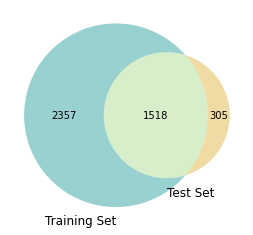

In [4]:
colors = ["#f5c767", "#5c96a5"]

venn2(subsets=[set(db_ec), set(mag_ec)],
    set_labels=["Training Set", "Test Set"],
    set_colors=["darkcyan", "goldenrod"] # "#f5c767", "#5c96a5" "teal", "gold"
)

print(len(set(db_ec)), "training ECs,", len(set(mag_ec)), "test ECs")

### Bar graph (305 unique)

In [5]:
# 305 unique EC numbers

uec = unique.drop(['media_id', 'species', 'source'], axis=1)

print(len(unset), "unique ECs to the Fenix21 test set")
print(unset)

# Fenix21 counts for the 305 unique EC numbers

enzyme_df = uec.value_counts("ec").reset_index().copy()
enzyme_df['Group'] = enzyme_df['ec'].apply(lambda x: x.strip().split('.')[0])
grouped_df = enzyme_df.groupby('Group')['count'].sum().reset_index()
grouped_df.columns = ['Group','Total Count']
ec_class = ['Oxidoreductases','Transferases','Hydrolases','Lyases','Isomerases','Ligases','Translocases']
grouped_df['Class'] = ec_class
taxa_enzyme_counts_1 = grouped_df[['Group','Class','Total Count']]

print("Fenix21 Counts:")
print(taxa_enzyme_counts_1)

# Distribution between classes of each of the unique EC numbers

uec_s = uec.drop("taxon_id", axis=1)
uec_s = uec_s.drop_duplicates()
enzyme_df = uec_s.value_counts("ec").reset_index().copy()
enzyme_df['Group'] = enzyme_df['ec'].apply(lambda x: x.strip().split('.')[0])
grouped_df = enzyme_df.groupby('Group')['count'].sum().reset_index()
grouped_df.columns = ['Group','Total Count']
ec_class = ['Oxidoreductases','Transferases','Hydrolases','Lyases','Isomerases','Ligases','Translocases']
grouped_df['Class'] = ec_class
taxa_enzyme_counts_2 = grouped_df[['Group','Class','Total Count']]

print('Class Distributions:')
print(taxa_enzyme_counts_2)

# Create normalized abundances

df1 = taxa_enzyme_counts_1.copy()
sum1 = df1["Total Count"].sum(axis=0)
df1["Ratio"] = df1["Total Count"].div(sum1)

df2 = taxa_enzyme_counts_2.copy()
sum2 = df2["Total Count"].sum(axis=0)
df2["Ratio"] = df2["Total Count"].div(sum2)

305 unique ECs to the Fenix21 test set
{'1.14.13.168', '7.2.4.5', '1.1.1.31', '5.1.99.3', '2.6.1.88', '3.7.1.26', '2.7.1.89', '1.1.1.367', '4.3.1.29', '7.4.2.2', '1.2.1.18', '3.1.4.50', '1.21.1.1', '1.8.5.9', '6.4.1.4', '2.4.1.129', '1.5.99.5', '1.1.5.13', '1.1.99.24', '2.5.1.26', '1.16.1.3', '2.1.1.350', '1.8.5.6', '1.5.8.1', '3.5.2.14', '2.1.1.331', '1.10.3.17', '6.1.1.13', '3.1.1.110', '4.3.2.7', '3.5.1.80', '2.7.1.218', '2.7.1.3', '1.3.1.48', '1.16.9.1', '2.3.1.210', '4.1.2.28', '4.2.2.13', '2.5.1.62', '4.1.1.68', '1.1.1.396', '1.14.11.18', '2.1.1.333', '2.4.1.268', '4.1.1.45', '2.1.1.342', '1.5.1.33', '1.3.1.20', '2.3.1.241', '1.3.7.9', '3.5.3.15', '1.14.11.47', '1.5.99.6', '1.8.4.16', '2.8.3.1', '3.1.1.14', '1.14.15.17', '2.3.3.1', '2.1.1.130', '1.3.99.23', '1.14.19.2', '6.4.1.8', '2.7.1.44', '2.7.8.43', '1.1.1.350', '3.5.1.107', '1.14.19.21', '3.1.1.53', '2.7.1.230', '1.8.98.2', '2.5.1.56', '2.4.2.40', '2.1.1.187', '1.8.5.5', '2.1.1.152', '1.16.3.3', '3.1.3.102', '1.5.8.4', '3.1

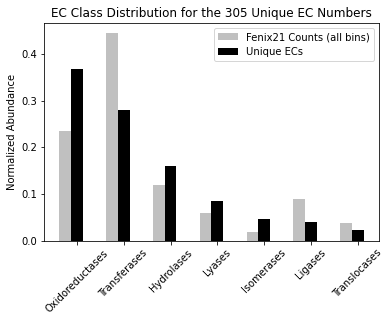

In [6]:
N = 7
ind = np.arange(N)  
width = 0.25
  
xvals = df1['Ratio']
bar1 = plt.bar(ind, xvals, width, color = 'silver') 
  
yvals = df2['Ratio']
bar2 = plt.bar(ind+width, yvals, width, color='black') 
  
plt.xticks(ind+width,['Oxidoreductases','Transferases','Hydrolases','Lyases','Isomerases','Ligases','Translocases'],rotation=45) 
plt.ylabel("Normalized Abundance") 
plt.title("EC Class Distribution for the 305 Unique EC Numbers") 
plt.legend((bar1, bar2), ('Fenix21 Counts (all bins)', 'Unique ECs')) 

plt.gca().set_facecolor('white') 

plt.show() 

### Bar graph (all)

In [7]:
tec = pd.read_csv(os.path.join(DATA_DIR, 'taxa2ec-final.csv'), low_memory=False)

# Summing the abundance of enzymes across our taxa related to different enzyme groups
enzyme_df = tec.value_counts("ec").reset_index().copy() #ecs.value_counts originally
enzyme_df['Group'] = enzyme_df['ec'].apply(lambda x: x.strip().split('.')[0])
grouped_df = enzyme_df.groupby('Group')['count'].sum().reset_index()
grouped_df.columns = ['Group','Total Count']
# Adding information on the type of enzymes
ec_class = ['Oxidoreductases','Transferases','Hydrolases','Lyases','Isomerases','Ligases','Translocases']
grouped_df['Class'] = ec_class

taxa_enzyme_counts = grouped_df[['Group','Class','Total Count']]
print(taxa_enzyme_counts)

bec = pd.read_csv(os.path.join(DATA_DIR, "model", "ml_input.csv"), low_memory=False)
bins = bec["source"].str.contains("KBase")
bec = bec[bins]

# Summing the abundance of enzymes across our taxa related to different enzyme groups
enzyme_df2 = bec.value_counts("ec").reset_index().copy() #ecs.value_counts originally
enzyme_df2['Group'] = enzyme_df2['ec'].apply(lambda x: x.strip().split('.')[0])
grouped_df2 = enzyme_df2.groupby('Group')['count'].sum().reset_index()
grouped_df2.columns = ['Group','Total Count']
# Adding information on the type of enzymes
ec_class = ['Oxidoreductases','Transferases','Hydrolases','Lyases','Isomerases','Ligases','Translocases']
grouped_df2['Class'] = ec_class

bin_enzyme_counts = grouped_df2[['Group','Class','Total Count']]
print(bin_enzyme_counts)

  Group            Class  Total Count
0     1  Oxidoreductases       250577
1     2     Transferases       512583
2     3       Hydrolases       462458
3     4           Lyases       146148
4     5       Isomerases        99566
5     6          Ligases       141588
6     7     Translocases        48603
  Group            Class  Total Count
0     1  Oxidoreductases        19797
1     2     Transferases        43665
2     3       Hydrolases        18635
3     4           Lyases        11449
4     5       Isomerases         7521
5     6          Ligases         9864
6     7     Translocases         6191


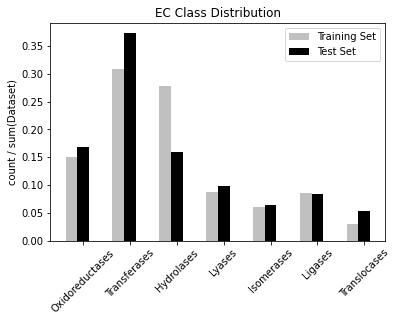

In [8]:
# Normalize counts
df1 = taxa_enzyme_counts.copy() 
sum1 = df1['Total Count'].sum(axis=0)
df1['Training_Proportion'] = df1['Total Count'].div(sum1)

df2 = bin_enzyme_counts.copy() 
sum2 = df2['Total Count'].sum(axis=0)
df2['Test_Proportion'] = df2['Total Count'].div(sum2)

N = 7
ind = np.arange(N)  
width = 0.25
  
xvals = df1['Training_Proportion']
bar1 = plt.bar(ind, xvals, width, color = 'silver') 
  
yvals = df2['Test_Proportion']
bar2 = plt.bar(ind+width, yvals, width, color='black') 
  
plt.xticks(ind+width,['Oxidoreductases','Transferases','Hydrolases','Lyases','Isomerases','Ligases','Translocases'],rotation=45) 
plt.ylabel("count / sum(Dataset)") 
plt.title("EC Class Distribution") 
plt.legend((bar1, bar2), ('Training Set', 'Test Set', 'Overlap')) 

plt.gca().set_facecolor('white') 

plt.show() 

In [9]:
df1 = df1.rename(columns={"Training_Proportion": "ra"}).drop(["Group", "Total Count"], axis=1)
df2 = df2.rename(columns={"Test_Proportion": "ra"}).drop(["Group", "Total Count"], axis=1)

df1["Set"] = "Training"
df2["Set"] = "Test"

frames = df1, df2
snsbp = pd.concat(frames)

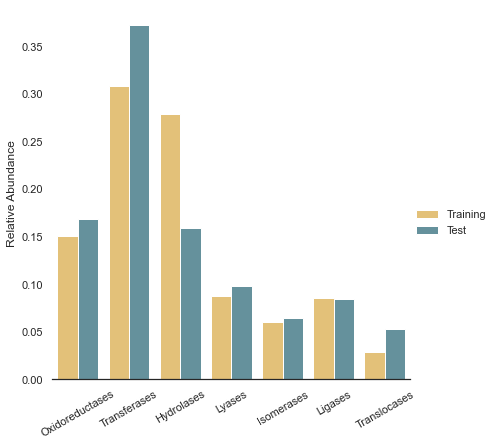

In [10]:
import seaborn as sns
sns.set_theme(style="white")
colors = ["#f5c767", "#5c96a5"]

# Draw a nested barplot by species and sex
g = sns.catplot(
    data=snsbp, kind="bar",
    x="Class", y="ra", hue="Set",
    palette=colors, alpha=1, height=6
)

g.despine(left=True)
g.set_axis_labels("", "Relative Abundance")
g.tick_params(axis='x', rotation=30)

g.legend.set_title("")

## Cofactor Comparison

### Bar graph (all, grouped)

In [11]:
bin_ec = ml_input[bins]

ec_list = bin_ec["ec"].to_list()
ec_list = set(ec_list)

print(len(ec_list), "unique bin ECs")

# Retrieving bin cofactors
#import modules.cofactors as cofactors
#bin_cofactors = cofactors.ec2metals(ec_list)

#bin_cofactors.to_csv(os.path.join(DATA_DIR, "cofactors", "bins-cofactors-raw.csv"), index=False)
#bin_cofactors.head()

1823 unique bin ECs


In [12]:
# Format ec2metals output
bin_cofactors = pd.read_csv((os.path.join(DATA_DIR, "cofactors", "bins-cofactors-raw.csv")))
cofactors = bin_cofactors.drop_duplicates().copy()
cofactors = cofactors.dropna(subset=['CofactorExtracted']).copy()

# List out all cofactors
CofactorFinal = cofactors.drop_duplicates(subset=['Query EC','CofactorFinal']).copy()
CofactorFinal.to_csv(os.path.join(DATA_DIR, "cofactors", "cofactors-bins.csv"), index=False) #SAVE

# Group cofactors by EC
grouped_cofactors = CofactorFinal.groupby("Query EC", as_index=False)["CofactorFinal"].apply(lambda x: "[%s]" % ', '.join(x))
grouped_cofactors.to_csv(os.path.join(DATA_DIR, "cofactors", "cofactors-bins-grouped.csv"), index=False) #SAVE

# TOGGLE filter:

#redox = grouped_cofactors["Query EC"].str.startswith("1.")
#grouped_cofactors = grouped_cofactors[redox]

print(len(CofactorFinal), "ECs with cofactors, approximately", len(grouped_cofactors), "of which are cambialistic")

grouped_cofactors.head()

1226 ECs with cofactors, approximately 707 of which are cambialistic


,Query EC,CofactorFinal
0,1.1.1.1,"[Zn, Fe]"
1,1.1.1.103,[Zn]
2,1.1.1.105,[Zn]
3,1.1.1.133,[Mg]
4,1.1.1.17,[Zn]


In [13]:
co = pd.read_csv(os.path.join(DATA_DIR, "cofactors", "cofactors-bins.csv"), low_memory=False)
ct = pd.read_csv(os.path.join(DATA_DIR, "cofactors", "cofactors-taxa.csv"), low_memory=False)

# TOGGLE filter:

#redox = co["Query EC"].str.startswith("1.")
#redox2 = ct["Query EC"].str.startswith("1.")
#co = co[redox]
#ct = ct[redox2]

#Create, merge, format counts 
coct = co["CofactorFinal"].value_counts().reset_index()
sum1 = coct["count"].sum(axis=0)
coct['ratio1'] = coct['count'].div(sum1)
coct = coct.rename(columns={"count": "count1"})

ctct = ct["CofactorFinal"].value_counts().reset_index()
sum2 = ctct["count"].sum(axis=0)
ctct['ratio2'] = ctct['count'].div(sum2)
ctct = ctct.rename(columns={"count": "count2"})

cf_df = pd.merge(left=coct, right=ctct, on="CofactorFinal", how="left")
cf_df = cf_df.fillna(0)

x = cf_df["count1"].sum(axis=0)
y = cf_df["count2"].sum(axis=0)
print(x, "annotated bin cofactors", y, "annotated database cofactors")

cf_df.to_csv("~/Desktop/cofactors.csv", index=False)
cf_df.head()

1226 annotated bin cofactors 3406 annotated database cofactors


,CofactorFinal,count1,ratio1,count2,ratio2
0,Mg,305,0.248777,671,0.195228
1,Fe,214,0.174551,602,0.175153
2,Zn,157,0.128059,425,0.123654
3,S,127,0.103589,322,0.093686
4,Mn,93,0.075856,252,0.073320


In [14]:
#bin_cofactors = {
#    'Elemental': ["C", "Ca", "Cl", "Co", "Cu", "Fe", "K", "La", "Mg", "Mn", "Mo", "Na", "Ni", "O", "S", "V", "W", "Zn", "metal"],
#    'Organic': ["ATP", "C", "FAD", "FMN", "L-ascorbate", "NAD", "NADP", "NADPH", "S-adenosyl-L-methionine", 
#                "an oxidized flavin", "biotin", "corrinoid", "glutathione", "homocitryl", "prenyl-FMN",
#                "pyridoxal 5'-phosphate", "pyrroloquinoline quinone", "pyruvate", "thiamine diphosphate"],
#    'Other': ["Se-Mo-molybdoprterin cytosine dinucleotide", "a monovalent", "NH4"]
#}

relabeled_cofactors = cf_df.copy()
dictionary = {
    "ATP": "Org", 
    "FAD": "Org", 
    "L-ascorbate": "Org", 
    "NADPH": "Org", 
    "NADP": "Org", 
    "NAD": "Org", 
    "S-adenosyl-L-methionine": "Org", 
    "an oxidized flavin": "Org", 
    "biotin": "Org", 
    "corrinoid": "Org", 
    "glutathione": "Org", 
    "homocitryl": "Org", 
    "prenyl-FMN": "Org",
    "FMN": "Org", 
    "pyridoxal 5'-phosphate": "Org", 
    "pyrroloquinoline quinone": "Org", 
    "pyruvate": "Org", 
    "thiamine diphosphate": "Org",
    "Se-Mo-molybdopterin cytosine dinucleotide": "Org",
    "a monovalent": "UM",
    "metal": "UM"
}

for key in dictionary.keys():
    relabeled_cofactors["CofactorFinal"] = relabeled_cofactors["CofactorFinal"].str.replace(key, dictionary[key])

relabeled_cofactors = relabeled_cofactors.groupby(['CofactorFinal'])[['count1', 'ratio1', 'count2', 'ratio2']].sum().reset_index()
relabeled_cofactors = relabeled_cofactors.sort_values(['count1'], ascending=[False])
relabeled_cofactors.head()

,CofactorFinal,count1,ratio1,count2,ratio2
8,Mg,305,0.248777,671,0.195228
5,Fe,214,0.174551,602,0.175153
20,Zn,157,0.128059,425,0.123654
16,S,127,0.103589,322,0.093686
15,Org,106,0.086460,436,0.126855


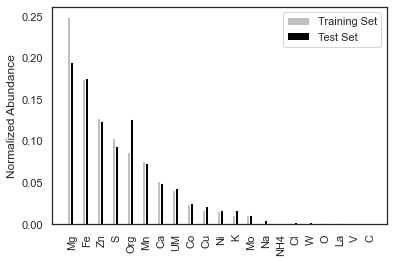

In [15]:
import numpy as np 
import matplotlib.pyplot as plt 

data = relabeled_cofactors # CHANGE with cf_df to see original cofactor labels (N = 40)
N = len(data)
ind = np.arange(N)  
width = 0.2
  
xvals = data['ratio1']
bar1 = plt.bar(ind, xvals, width, color = 'silver') 
  
yvals = data['ratio2']
bar2 = plt.bar(ind+width, yvals, width, color='black') 

plt.xticks(ind+width, data["CofactorFinal"], rotation=90) #
plt.ylabel("Normalized Abundance") # => len(set)=1
#plt.xlabel("Cofactor")
#plt.title("Cofactor distribution") 
plt.legend((bar1, bar2), ('Training Set', 'Test Set'))

#plt.gca().set_facecolor('white') 

plt.show() 

In [16]:
df1 = data[["CofactorFinal", "count1", "ratio1"]]
df2 = data[["CofactorFinal", "count2", "ratio2"]]

df1["Set"] = "Training"
df2["Set"] = "Test"

df1 = df1.rename(columns={"count1": "ct", "ratio1": "ra"})
df2 = df2.rename(columns={"count2": "ct", "ratio2": "ra"})

frames = df1, df2
snsbp = pd.concat(frames)

C:\Users\jakel\AppData\Local\Temp\ipykernel_2152\238035980.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1["Set"] = "Training"
C:\Users\jakel\AppData\Local\Temp\ipykernel_2152\238035980.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2["Set"] = "Test"


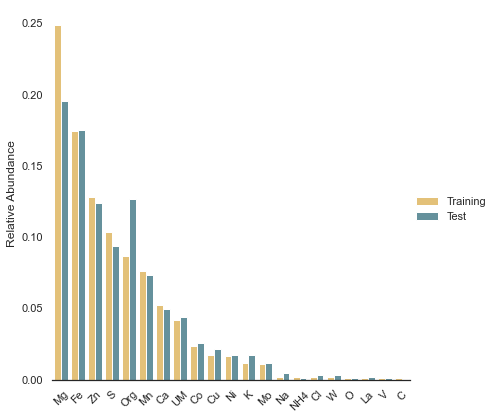

In [17]:
import seaborn as sns
sns.set_theme(style="white")

#colors = ["#fdb462", "#c46f0e"] 
#colors = ["#c4dbea", "#8aa996"] 
#colors = ["#f5b139", "#0772a7"] 
colors = ["#f5c767", "#5c96a5"]

# Draw a nested barplot by species and sex
g = sns.catplot(
    data=snsbp, kind="bar",
    x="CofactorFinal", y="ra", hue="Set",
    #errorbar="sd", 
    palette=colors, alpha=1, height=6 
)

g.despine(left=True)
g.set_axis_labels("", "Relative Abundance")
g.tick_params(axis='x', rotation=45)

g.legend.set_title("")

In [18]:
tail = ["Na","NH4","Cl","W","O","La","V","C"] #"Co","Cu","Ni","K","Mo",
filter = snsbp["CofactorFinal"].isin(tail)
snsdf = snsbp[filter]

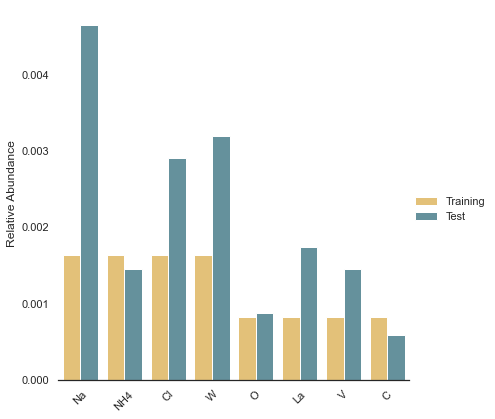

In [19]:
import seaborn as sns
sns.set_theme(style="white")

#colors = ["#fdb462", "#c46f0e"] 
#colors = ["#8aa996", "#c4dbea"] 
colors = ["#f5c767", "#5c96a5"]

# Draw a nested barplot by species and sex
g = sns.catplot(
    data=snsdf, kind="bar",
    x="CofactorFinal", y="ra", hue="Set",
    #errorbar="sd", 
    palette=colors, alpha=1, height=6
)

g.despine(left=True)
g.set_axis_labels("", "Relative Abundance")
g.tick_params(axis='x', rotation=45)

g.legend.set_title("")

NOTE: most "metal" annotations are vague "divalent metal cation", without a specific metals listed in UniProtKB

### Bar graph (all, tail)

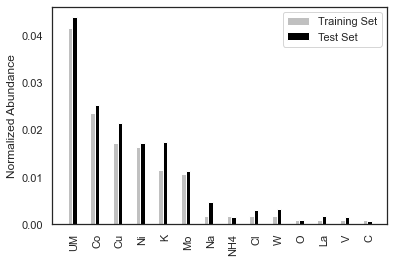

In [20]:
import numpy as np 
import matplotlib.pyplot as plt 

n = 7 # number of highest abundance cofactors to omit
N = len(relabeled_cofactors)-n 
data = relabeled_cofactors.iloc[n:n+N]
ind = np.arange(N)  
width = 0.2
  
xvals = data['ratio1']
bar1 = plt.bar(ind, xvals, width, color = 'silver') 
  
yvals = data['ratio2']
bar2 = plt.bar(ind+width, yvals, width, color='black') 

plt.xticks(ind+width, data["CofactorFinal"], rotation=90) 
plt.ylabel("Normalized Abundance") 
#plt.title("Cofactor distribution (tail)") 
plt.legend((bar1, bar2), ('Training Set', 'Test Set'))

plt.gca().set_facecolor('white') 

plt.show() 

### Bar graph (metals only)

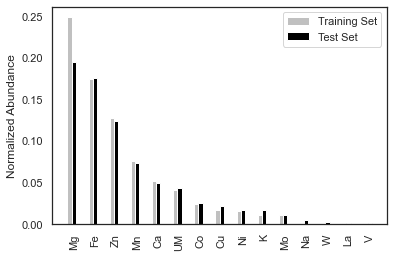

In [21]:
metals_df = relabeled_cofactors.copy()

# Subset with ONLY metal cofactors:
metals = pd.read_csv(os.path.join(DATA_DIR, "cofactors", "metals-list.csv"))
metals_list = metals['Metals'].to_list()
mask = metals_df['CofactorFinal'].isin(metals_list)
metals_cf = metals_df[mask]

import numpy as np 
import matplotlib.pyplot as plt 

data = metals_cf
N = len(data)
ind = np.arange(N)  
width = 0.2
  
xvals = data['ratio1']
bar1 = plt.bar(ind, xvals, width, color = 'silver') 
  
yvals = data['ratio2']
bar2 = plt.bar(ind+width, yvals, width, color='black') 

plt.xticks(ind+width, data["CofactorFinal"], rotation=90) 
plt.ylabel("Normalized Abundance") 
#plt.title("Cofactor distribution (metals only)") 
plt.legend((bar1, bar2), ('Training Set', 'Test Set'))

plt.gca().set_facecolor('white') 

plt.show() 

### ECDF

In [22]:
metals_cf.head()

train_metals = metals_cf[["CofactorFinal", "count1", "ratio1"]].copy()
train_metals["Set"] = "Training"
train_metals = train_metals.rename(columns={"count1": "Count", "ratio1": "Ratio"})

test_metals = metals_cf[["CofactorFinal", "count2", "ratio2"]].copy()
test_metals["Set"] = "Test"
test_metals = test_metals.rename(columns={"count2": "Count", "ratio2": "Ratio"})

frames = train_metals, test_metals
ecdf = pd.concat(frames)
ecdf

,CofactorFinal,Count,Ratio,Set
8,Mg,305,0.248777,Training
5,Fe,214,0.174551,Training
20,Zn,157,0.128059,Training
9,Mn,93,0.075856,Training
1,Ca,64,0.052202,Training
17,UM,51,0.041599,Training
3,Co,29,0.023654,Training
4,Cu,21,0.017129,Training
13,Ni,20,0.016313,Training
6,K,14,0.011419,Training


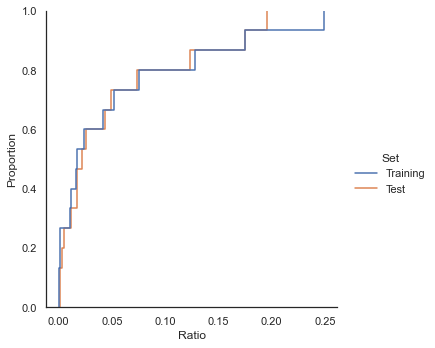

In [23]:
sns.displot(x='Ratio', hue='Set', data=ecdf, kind='ecdf')

### Heatmap 

In [24]:
cf = pd.read_csv(os.path.join(DATA_DIR, "cofactors", "cofactors-bins.csv"), low_memory=False)
cf = cf[["Query EC", "CofactorFinal"]]
cf = cf.rename(columns={"Query EC": "ec", "CofactorFinal": "cofactor"})

taxa = pd.read_csv(os.path.join(DATA_DIR, "model", "ml_input.csv"), low_memory=False)
bins = taxa["source"].str.contains("KBase")
taxa = taxa[bins]

binco = pd.merge(left=taxa, right=cf, on="ec", how="left")
binco = binco[["taxon_id", "ec", "cofactor"]]
binco = binco.rename(columns={"taxon_id": "bin_name"})

binco.to_csv(os.path.join(DATA_DIR, "cofactors", "bin-ec-cofactor.csv"), index=False)
binco.head()

,bin_name,ec,cofactor
0,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,2.1.1.297,NaN
1,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,6.1.1.21,NaN
2,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,2.7.1.33,NH4
3,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,2.7.1.33,Mn
4,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,2.7.1.33,K


In [25]:
data = pd.read_csv(os.path.join(os.path.join(DATA_DIR, "cofactors", "bin-ec-cofactor.csv")))

data = data.dropna()
data_heatmap = data[["bin_name", "cofactor"]].drop_duplicates()
data_heatmap["count"] = 1
data_heatmap = data_heatmap.pivot(index="bin_name", columns="cofactor", values="count") #.pivot

# Can set a filter to only show specific bins

#(z, text_auto=True, aspect="auto")
fig = px.imshow(data_heatmap, aspect="auto") #
fig.update_coloraxes(showscale=False)
fig.update_layout(template='plotly_white')
#fig.update_yaxes(showticklabels=False)

In [26]:
#TODO: update axes to see individual bins

### Clustermap

In [27]:
import seaborn as sns
data = pd.read_csv(os.path.join(os.path.join(DATA_DIR, "cofactors", "bin-ec-cofactor.csv")))

# RELABEL long ass name
#data['bin'] = data['bin_name'].str.extract(r'(Bin\.\d+\.[^_]+_[A-Z])')

data = data[["bin_name", "cofactor"]].drop_duplicates()
data["count"] = 1
data = pd.pivot_table(data, values='count', index='bin_name', columns='cofactor')
data = data.fillna(0)

data.head()
#data.to_csv("~/Desktop/data.csv", index=False)

cofactor,ATP,C,Ca,Cl,Co,Cu,FAD,FMN,Fe,K,...,biotin,corrinoid,glutathione,homocitryl,metal,prenyl-FMN,pyridoxal 5'-phosphate,pyrroloquinoline quinone,pyruvate,thiamine diphosphate
bin_name,,,,,,,,,,,,,,,,,,,,,
KBase_derived_Bin.001.fastaBA_F_extracted_bins.AssemblySet_DRAM.gff,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
KBase_derived_Bin.001.fastaBA_S_extracted_bins.AssemblySet_DRAM.gff,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0
KBase_derived_Bin.001.fastaCF_F_extracted_bins.AssemblySet_DRAM.gff,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,0.0,1.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0
KBase_derived_Bin.001.fastaCG_S_extracted_bins.AssemblySet_DRAM.gff,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0
KBase_derived_Bin.001.fastaFE_F_extracted_bins.AssemblySet_DRAM.gff,0.0,0.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0


<bound method _AxesBase.set_axis_off of <Axes: >>

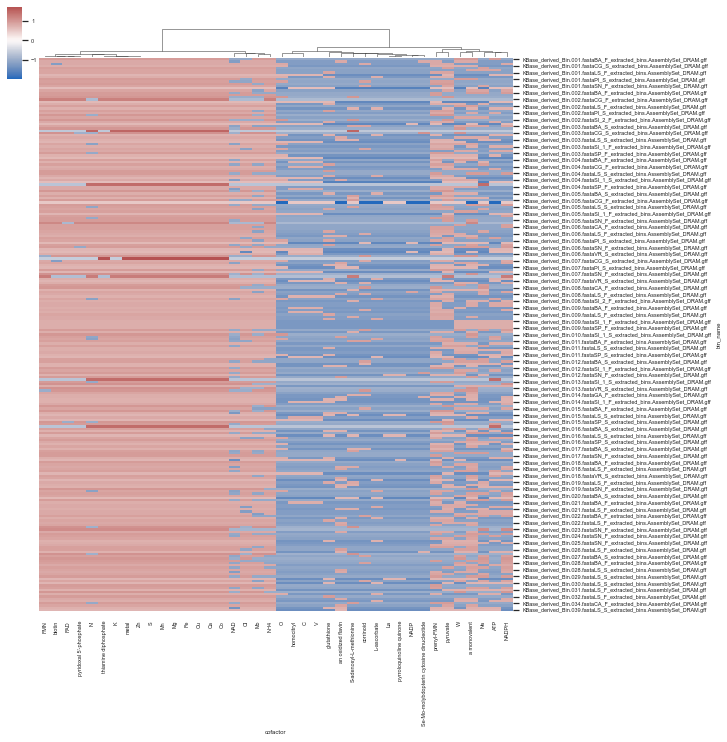

In [28]:
sns.set(font_scale=0.5)

cm = sns.clustermap(
    data, 
    cmap="vlag", 
    center=0, 
    z_score=0, #to set values as a mean of each row
    dendrogram_ratio=0.05, 
    cbar_pos=(0, 0.92, 0.02, 0.10),
    #figsize=(10, 40), # toggle for row readability
    method='ward',
    row_cluster=False
)
    
cm.cax.set_visible(True) # remove color bar for binary data
cm.cax.set_axis_off

In [29]:
# Most impactful features for model outputs
m4f = ["4.1.1.17", "1.9.3.1", "3.5.1.5", "3.2.1.20", "1.1.1.1", "3.2.1.22", "2.1.2.1", "3.5.3.6", "3.2.1.21"]
print(len(m4f), "important model features (04-Model-Eval)")

# Retrieving bin cofactors
import modules.cofactors as cofactors
m4f_cofactors = cofactors.ec2metals(m4f)

# Format
cofactors = m4f_cofactors.drop_duplicates().copy()
cofactors = cofactors.dropna(subset=['CofactorExtracted']).copy()

CofactorFinal = cofactors.drop_duplicates(subset=['Query EC','CofactorFinal']).copy()
CofactorFinal.to_csv(os.path.join(DATA_DIR, "cofactors", "cofactors-feature_importance.csv"), index=False) #SAVE

grouped_cofactors = CofactorFinal.groupby("Query EC", as_index=False)["CofactorFinal"].apply(lambda x: "[%s]" % ', '.join(x))
grouped_cofactors.to_csv(os.path.join(DATA_DIR, "cofactors", "cofactors-feature_importance-grouped.csv"), index=False) #SAVE

grouped_cofactors

9 important model features (04-Model-Eval)


100%|██████████| 9/9 [00:08<00:00,  1.11it/s]


,Query EC,CofactorFinal
0,1.1.1.1,"[Zn, Fe]"
1,3.2.1.20,"[NAD, Mn]"
2,3.2.1.22,"[Mg, Ca, Mn, NAD]"
3,3.5.1.5,[Ni]


# Environmental Samples

## Physicochemistry

In [30]:
model_df = pd.read_csv(os.path.join(DATA_DIR, 'model', 'ml-model-output.csv'))
model_df = model_df.rename(columns={"Media Cluster": "media_cluster", "taxon_id": "bin", "neighbor_taxon_id": "taxon_id"})

f_env = pd.read_csv(os.path.join(DATA_DIR, 'MAGs', 'FENIX21', 'envdata.csv'))
f_env = f_env.astype(str)
env_subset = f_env[["SiteID", "site_name", "waterType", "temp", "ph", "spc","sal", "alk_tot"]]
env_subset.head()

,SiteID,site_name,waterType,temp,ph,spc,sal,alk_tot
0,AS,Acqua sauna lido scoglio,nan,65.0,5.96,nan,36.0,nan
1,BA,Bagnone,nan,64.0,7.0,nan,nan,nan
2,CA,Acqua Cantani,Ca-HCO3,17.48,6.34,2.757,0.14,1200.0
3,CF,Terme Caracciolo Forte,Ca-HCO3,53.0,5.36,3.067,0.156,1400.0
4,CG,Capasso geyser,Na-Cl,47.2,6.51,9.78,0.528,1400.0


In [31]:
# Merging our metadata with the model output
df1 = model_df
df2 = env_subset

# Using regex to capture the two-letter identifier
df1['SiteID'] = df1['bin'].str.extract(r'fasta([A-Z]{2})_(?:F|S)_extracted_bins')

# Clean up identifiers to ensure they match
df1.loc[:, 'SiteID'] = df1['SiteID'].str.strip().str.upper()
df2.loc[:, 'SiteID'] = df2['SiteID'].str.strip().str.upper()

# Merge our dataframes
benv = pd.merge(left=df1, right=df2, on="SiteID", how="left")

benv.to_csv(os.path.join(DATA_DIR, "model", "output-metadata.csv"), index=False)
benv.head()

,Component 1,Component 2,Component 3,Component 4,Component 5,Component 6,Component 7,Component 8,Component 9,Component 10,...,taxon_id,media_cluster,SiteID,site_name,waterType,temp,ph,spc,sal,alk_tot
0,9.427101,5.556786,5.026694,4.718250,4.642046,4.580090,4.598486,4.929774,5.921600,6.780723,...,438.0,10.0,BA,Bagnone,nan,64.0,7.0,nan,nan,nan
1,9.438310,5.577195,4.848787,4.642054,4.625227,4.483598,4.409244,4.932186,5.987400,6.837227,...,28127.0,19.0,BA,Bagnone,nan,64.0,7.0,nan,nan,nan
2,9.447886,5.541127,5.050787,4.717380,4.655841,4.581066,4.613263,4.935236,5.921442,6.821482,...,1496.0,NaN,CF,Terme Caracciolo Forte,Ca-HCO3,53.0,5.36,3.067,0.156,1400.0
3,9.474887,5.521941,5.061490,4.708226,4.687949,4.567853,4.590333,4.946699,5.907719,6.889502,...,2966552.0,6.0,CG,Capasso geyser,Na-Cl,47.2,6.51,9.78,0.528,1400.0
4,9.431704,5.578809,4.869885,4.653165,4.616782,4.497761,4.442394,4.926748,5.984292,6.815332,...,28127.0,19.0,FE,Sorgente Ferrata,Ca-HCO3,15.22,6.49,1.946,0.1,800.0


## Cofactors

### Upset plot (all cofactors)

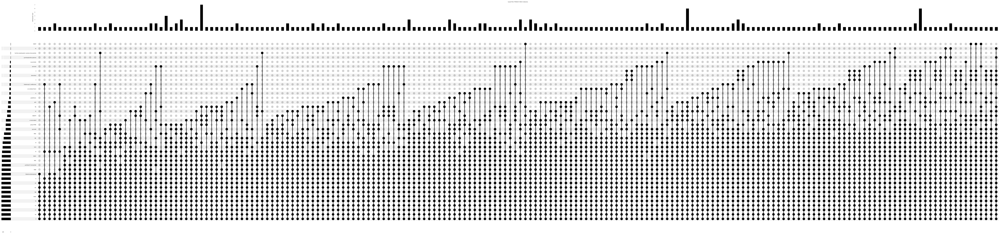

In [32]:
from upsetplot import UpSet, from_memberships
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

df = pd.read_csv(os.path.join(os.path.join(DATA_DIR, "cofactors", "bin-ec-cofactor.csv")))
df = df.drop("ec", axis=1).dropna()

# Build matrix for cofactor upset plot
cofactor_matrix = df.pivot_table(index='bin_name', columns='cofactor', aggfunc=lambda x:True, fill_value=False)
cofactor_matrix.set_index(cofactor_matrix.columns.tolist(), inplace=True)
cofactor_matrix = cofactor_matrix.groupby(level=list(range(cofactor_matrix.index.nlevels))).size()

upset = UpSet(cofactor_matrix)
upset.plot()
ax = plt.gca()  # Get the current axis to modify
plt.title('Upset Plot: FENIX21 MAG Cofactors')

plt.gca().set_facecolor('white') 

plt.show()
    # y-axis represents each of our cofactors, x-axis represents the different cases of overlap
    # left-hand bars represent relative abundances of each cofactors across all cases
    # bars above represent how many bins share the same overlap of cofactors

### Upset plot (unique)

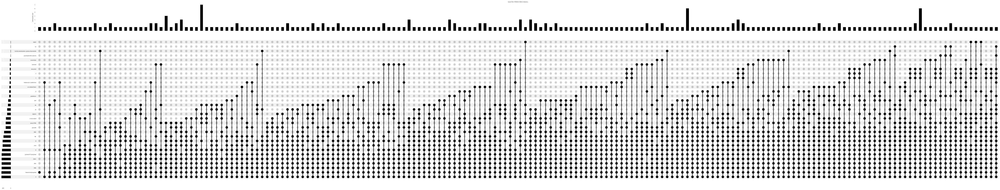

In [33]:
# Hide cofactors which are present everywhere
universal_cofactors = ["S", "Co", "Ca", "Cu", "Fe", "metal", "Mn", "Mg", "Zn"] # K not present in one bin, thiamine diphosphate in two
mask = df["cofactor"].isin(universal_cofactors)
df = df[~mask]

# Build matrix for cofactor upset plot
cofactor_matrix = df.pivot_table(index='bin_name', columns='cofactor', aggfunc=lambda x:True, fill_value=False)
cofactor_matrix.set_index(cofactor_matrix.columns.tolist(), inplace=True)
cofactor_matrix = cofactor_matrix.groupby(level=list(range(cofactor_matrix.index.nlevels))).size()

upset = UpSet(cofactor_matrix)
upset.plot()
ax = plt.gca()  # Get the current axis to modify
plt.title('Upset Plot: FENIX21 MAG Cofactors')

plt.gca().set_facecolor('white') 

plt.show()

### Upset plot (metals only)

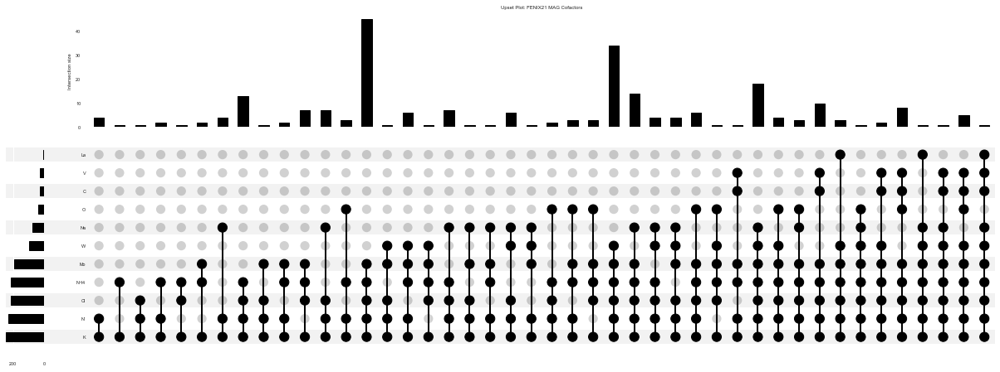

In [34]:
universal_cofactors = ["S", "Co", "Ca", "Cu", "Fe", "metal", "Mn", "Mg", "Zn"]
other_cofactors = ["La", "V", "O", "C", "Na", "W", "Mo", "Cl", "Ni", "NH4", "K"]

mask = df["cofactor"].isin(universal_cofactors)
mask2 = df["cofactor"].isin(other_cofactors)
df = df [mask | mask2]

# Build matrix for cofactor upset plot
cofactor_matrix = df.pivot_table(index='bin_name', columns='cofactor', aggfunc=lambda x:True, fill_value=False)
cofactor_matrix.set_index(cofactor_matrix.columns.tolist(), inplace=True)
cofactor_matrix = cofactor_matrix.groupby(level=list(range(cofactor_matrix.index.nlevels))).size()

upset = UpSet(cofactor_matrix)
upset.plot()
ax = plt.gca()  # Get the current axis to modify
plt.title('Upset Plot: FENIX21 MAG Cofactors')

plt.gca().set_facecolor('white') 

plt.show()

### Upset plot (ICP-MS)

In [35]:
upset_input = pd.DataFrame(cofactor_matrix)
upset_input.to_csv("~/Desktop/upset.csv")

In [36]:
# Giovannelli geochem colormap
color_mapping_url = "https://raw.githubusercontent.com/giovannellilab/geochem/main/inst/extdata/metal-color-mapping.csv"
color_mapping = pd.read_csv(color_mapping_url)
color_mapping = color_mapping.rename(columns={"element": "Metal"}).drop("type", axis=1)
color_mapping["color"] = color_mapping["color"].str.replace("#F7F7F7", "#c46f0e") # change iron from white
color_mapping["color"] = color_mapping["color"] + "75"
palette = dict(zip(color_mapping['Metal'], color_mapping['color']))

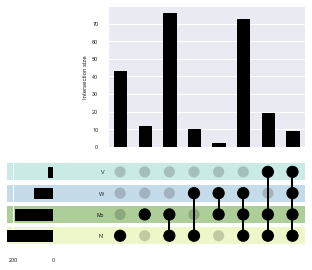

In [37]:
measured_cofactors = ["Fe", "Mn", "Co", "Cu", "Ni", "Zn", "V", "W", "Cl", "Br", "S", "P", "K", "Mg", "Ca"]
measured_metals = ["Fe", "Mn", "Mo", "Co", "Cu", "Ni", "Zn", "V", "W"]

mask = df["cofactor"].isin(measured_metals)
df = df [mask]

# Build matrix for cofactor upset plot
cofactor_matrix = df.pivot_table(index='bin_name', columns='cofactor', aggfunc=lambda x:True, fill_value=False)
cofactor_matrix.set_index(cofactor_matrix.columns.tolist(), inplace=True)
cofactor_matrix = cofactor_matrix.groupby(level=list(range(cofactor_matrix.index.nlevels))).size()



upset = UpSet(cofactor_matrix)

for _, row in color_mapping.iterrows():
    upset.style_categories(
        row["Metal"],
        shading_facecolor=row["color"]
    )

upset.plot()

plt.show()

In [38]:
#cofactor_matrix.to_csv(os.path.join(DATA_DIR, "cofactors", "ICP-MS_overlap.csv"), index=False)

### Bar graph (cofactors)

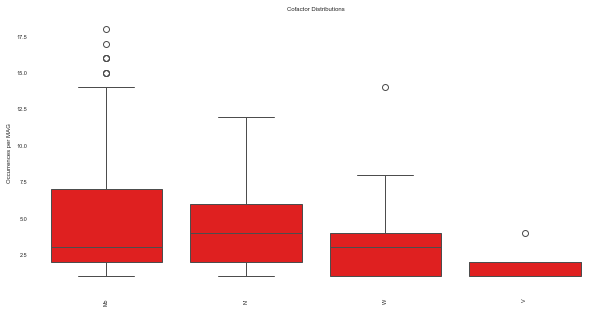

In [39]:
# Count the occurrences of each cofactor per bin
cofactor_counts = df.groupby(['bin_name', 'cofactor']).size().reset_index(name='count')
cofactor_distribution = cofactor_counts.groupby('cofactor')['count'].apply(list).reset_index()

# Convert the data into a long format suitable for seaborn
df_long = cofactor_counts

# Plot the box plots
plt.figure(figsize=(10, 5))
sns.boxplot(x='cofactor', y='count', data=df_long, color='red')
plt.title('Cofactor Distributions')
plt.xticks(rotation=90) 
plt.xlabel('')
#plt.ylim((0, 20))
plt.ylabel('Occurrences per MAG')

plt.gca().set_facecolor('white') 

plt.show()

### Bar plot (cofactors, fluids vs seds)

Cofactor sources: 58025 sediment-derived, 66020 fluid-derived
MAGs: 105 sediment samples, 142 fluid samples


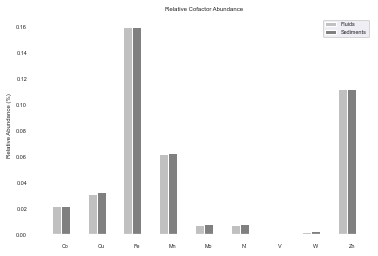

In [40]:
data = pd.read_csv(os.path.join(os.path.join(DATA_DIR, "cofactors", "bin-ec-cofactor.csv")))
data = data.dropna()

# Splitting into fluids/sediments
seds = data["bin_name"].str.contains("_S_")
sdf = data[seds]
fdf = data[~seds]

print("Cofactor sources:", len(sdf), "sediment-derived,", len(fdf), "fluid-derived")

# Making lists of bin names
bin_names = data["bin_name"].drop_duplicates()
sbn = bin_names[seds]
fbn = bin_names[~seds]

print("MAGs:", len(sbn), "sediment samples,", len(fbn), "fluid samples")

# Fluid proportions
df1 = fdf.drop(['bin_name', 'ec'], axis=1)
df1["count"] = 1
total1 = len(df1)
flugr = df1.groupby(['cofactor'])['count'].sum().reset_index()
flugr["ratio"] = flugr["count"].div(total1)

# Sediment proportions
df2 = sdf.drop(['bin_name', 'ec'], axis=1)
df2["count"] = 1
total2 = len(df2)
sedgr = df2.groupby(['cofactor'])['count'].sum().reset_index()
sedgr["ratio"] = sedgr["count"].div(total2)

# Filter
metals = ["Fe", "Mn", "V", "Co", "Ni", "Cu", "Zn", "Mo", "W"]
f1 = flugr["cofactor"].isin(metals)
f2 = sedgr["cofactor"].isin(metals)
flumet = flugr[f1]
sedmet = sedgr[f2]

# Merge
flumet = flumet.rename(columns={"count": "fluid_count", "ratio": "fluid_ratio"})
sedmet = sedmet.rename(columns={"count": "sed_count", "ratio": "sed_ratio"})
merged = pd.merge(left=flumet, right=sedmet, on="cofactor", how="left")

N = 9
ind = np.arange(N)  
width = 0.25
  
xvals = merged['fluid_ratio']
bar1 = plt.bar(ind, xvals, width, color = 'silver') 
  
yvals = merged['sed_ratio']
bar2 = plt.bar(ind+width, yvals, width, color='grey') 
  
plt.xticks(ind+width,merged["cofactor"]) 
plt.ylabel("Relative Abundance (%)") 
plt.title("Relative Cofactor Abundance") 
plt.legend((bar1, bar2), ('Fluids', 'Sediments')) 
plt.grid(False)

plt.gca().set_facecolor('white') 

plt.show() 

## Metals vs. Cofactors

### Bar graph (fluids)

In [41]:
data = pd.read_csv(os.path.join(os.path.join(DATA_DIR, "cofactors", "bin-ec-cofactor.csv")))
data = data.dropna()

# Splitting into fluids/sediments
seds = data["bin_name"].str.contains("_S_")
sdf = data[seds]
fdf = data[~seds]

print("Cofactor sources:", len(sdf), "sediment-derived,", len(fdf), "fluid-derived")

# Making lists of bin names
bin_names = data["bin_name"].drop_duplicates()
sbn = bin_names[seds]
fbn = bin_names[~seds]

print("MAGs:", len(sbn), "sediment samples,", len(fbn), "fluid samples")

print(sdf.head())
print(fdf.head())

Cofactor sources: 58025 sediment-derived, 66020 fluid-derived
MAGs: 105 sediment samples, 142 fluid samples
                                              bin_name        ec cofactor
574  KBase_derived_Bin.001.fastaBA_S_extracted_bins...  2.7.13.3       Fe
575  KBase_derived_Bin.001.fastaBA_S_extracted_bins...  2.7.13.3       Ca
576  KBase_derived_Bin.001.fastaBA_S_extracted_bins...  2.7.13.3       Cu
577  KBase_derived_Bin.001.fastaBA_S_extracted_bins...  2.7.13.3       Mg
578  KBase_derived_Bin.001.fastaBA_S_extracted_bins...  2.7.13.3        S
                                             bin_name         ec cofactor
2   KBase_derived_Bin.001.fastaBA_F_extracted_bins...   2.7.1.33      NH4
3   KBase_derived_Bin.001.fastaBA_F_extracted_bins...   2.7.1.33       Mn
4   KBase_derived_Bin.001.fastaBA_F_extracted_bins...   2.7.1.33        K
10  KBase_derived_Bin.001.fastaBA_F_extracted_bins...   2.5.1.19       Zn
11  KBase_derived_Bin.001.fastaBA_F_extracted_bins...  4.2.1.136        K


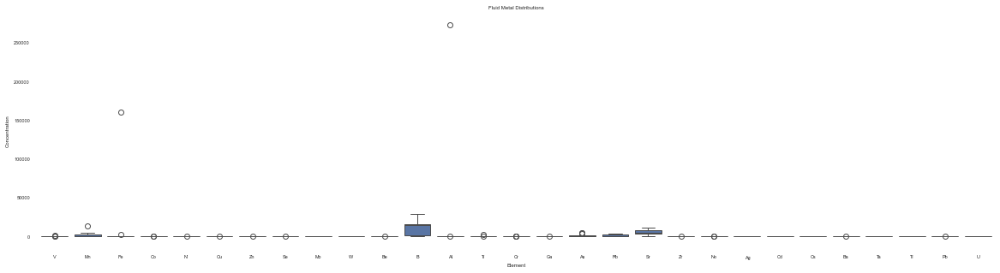

In [42]:
# Fluid metal distributions

fm = pd.read_csv(os.path.join(DATA_DIR, "MAGs", "FENIX21", "fluid_metals.csv"))
df = fm.drop('ExpID', axis=1)

df.iloc[:, 2:] = df.iloc[:, 2:].apply(pd.to_numeric, errors='coerce')
df_melted = df.melt(id_vars=["SiteID"], var_name="Element", value_name="Concentration")
df_melted.dropna(subset=["Concentration"], inplace=True)

# toggle B (attention to plt.ylim())
b = df_melted["Element"].str.contains("b")
df_nob = df_melted[~b]

plt.figure(figsize=(20, 5))
sns.boxplot(x="Element", y="Concentration", data=df_melted)
#plt.ylim((0, 300))
plt.title("Fluid Metal Distributions")
plt.gca().set_facecolor('white') 

plt.show()

fig = px.box(df_melted, 
    x="Element", 
    y="Concentration", 
    points="all",  # Show all points, including outliers
    hover_data=["SiteID"],  # Display SiteID on hover
    #title="Fluid Metal Distributions (all)",
    template="plotly_white"
)
#fig.update_yaxes(range=[0, 500])

fig.show()

### Bar graph (sediments)

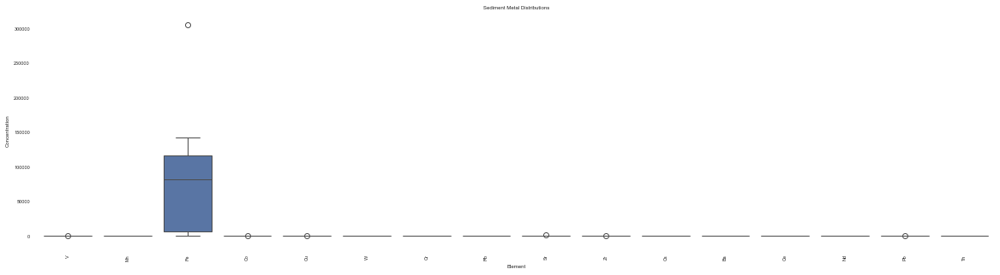

In [43]:
# Sediment metal distributions

sm = pd.read_csv(os.path.join(DATA_DIR, "MAGs", "FENIX21", "sediment_metals.csv"))
df = sm.drop('ExpID', axis=1)

df.iloc[:, 2:] = df.iloc[:, 2:].apply(pd.to_numeric, errors='coerce')
df_melted = df.melt(id_vars=["SiteID"], var_name="Element", value_name="Concentration")
df_melted.dropna(subset=["Concentration"], inplace=True)

plt.figure(figsize=(20, 5))
sns.boxplot(x="Element", y="Concentration", data=df_melted)
#plt.ylim((0, 900)) 
plt.xticks(rotation=90)
plt.title("Sediment Metal Distributions")
plt.gca().set_facecolor('white') 

plt.show()

fig = px.box(df_melted, 
    x="Element", 
    y="Concentration", 
    points="all",  # Show all points, including outliers
    hover_data=["SiteID"], 
    #title="Sediment Metal Distributions",
    template="plotly_white"
)

fig.show()

### Bar comp. (fluids)

In [44]:
# Fluid cofactors:

data = pd.read_csv(os.path.join(os.path.join(DATA_DIR, "cofactors", "bin-ec-cofactor.csv")))
data = data.dropna()

bin_names = data["bin_name"].drop_duplicates()
seds = data["bin_name"].str.contains("_S_")
fbn = bin_names[~seds]
fdf = data[~seds]

# Using regex to capture the two-letter identifier
df1 = fdf.copy()
df1['SiteID'] = df1['bin_name'].str.extract(r'fasta([A-Z]{2})_(?:F|S)_extracted_bins')
df1.loc[:, 'SiteID'] = df1['SiteID'].str.strip().str.upper()

print(len(fbn), "fluid samples")

# Fluid metal distributions:

fm = pd.read_csv(os.path.join(DATA_DIR, "MAGs", "FENIX21", "fluid_metals.csv"))
df = fm.drop('ExpID', axis=1)

df.iloc[:, 2:] = df.iloc[:, 2:].apply(pd.to_numeric, errors='coerce')
fluid_melted = df.melt(id_vars=["SiteID"], var_name="Element", value_name="Concentration")
fluid_melted.dropna(subset=["Concentration"], inplace=True)

#fluid_melted.head()

142 fluid samples


In [45]:
# Set cofactor counts for each site
df1["count"] = 1
df1_grouped = df1.groupby(['SiteID', 'cofactor'])['count'].sum().reset_index()

# Sum the number of cofactors for each site
site_total = df1_grouped.groupby(['SiteID'])['count'].sum().reset_index()
site_total = site_total.rename(columns={"count": "site_total"})

# Merge and calculate the normalized ratio for each site
fluid_cofactors = pd.merge(left=df1_grouped, right=site_total, on="SiteID", how="left")
fluid_cofactors["ratio"] = fluid_cofactors.iloc[:,2].div(fluid_cofactors.iloc[:,3])

fluid_cofactors.head()

,SiteID,cofactor,count,site_total,ratio
0,BA,ATP,2,9245,0.000216
1,BA,C,2,9245,0.000216
2,BA,Ca,349,9245,0.037750
3,BA,Cl,31,9245,0.003353
4,BA,Co,193,9245,0.020876


In [46]:
# Format dataframes for plotting

df1 = fluid_melted
df1['Type'] = 'Concentration'
df1 = df1.rename(columns={'Element': 'Metal', 'Concentration': 'Value'})

df2 = fluid_cofactors.drop(['count', 'site_total'], axis=1)
df2['Type'] = 'Ratio'
df2 = df2.rename(columns={'cofactor': 'Metal', 'ratio': 'Value'})

fluid_combined = pd.concat([df1, df2])

# Filter for the overlap between cofactors and available concentrations: 

fluid_metals = fluid_melted["Element"].to_list()
fm_list = set(fluid_metals)
filter1 = fluid_combined["Metal"].isin(fm_list)

metal_cofactors = fluid_cofactors["cofactor"].to_list()
mc_list = set(metal_cofactors)
filter2 = fluid_combined["Metal"].isin(mc_list)

fluid_combined = fluid_combined[filter1 & filter2]

fluid_combined

,SiteID,Metal,Value,Type
0,AS,V,2.618000,Concentration
2,CA,V,2.564000,Concentration
3,CF,V,0.363000,Concentration
4,CG,V,0.098000,Concentration
6,FE,V,2.275000,Concentration
...,...,...,...,...
324,SP,Mo,0.004663,Ratio
329,SP,Ni,0.004080,Ratio
333,SP,V,0.001166,Ratio
334,SP,W,0.002623,Ratio


In [47]:
# Toggle filter for high concentration metals
omit = ["Mn", "Fe"]
omm = fluid_combined["Metal"].isin(omit)

fluid_filter = fluid_combined[~omm]
fluid_outlier = fluid_combined[omm]

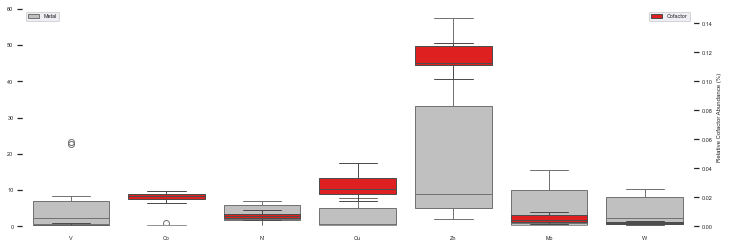

In [48]:
fig, ax1 = plt.subplots(figsize=(12, 4))
plt.gca().set_facecolor('white') 

# Boxplot for Concentration
sns.boxplot(x='Metal', y='Value', data=fluid_filter[fluid_filter['Type'] == 'Concentration'], ax=ax1, color="silver") #hue='Type', palette="dark:silver"
ax1.set_ylabel(None) #'Trace Metal Concentration (ppb)'
ax1.set_xlabel(None)

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()
sns.boxplot(x='Metal', y='Value', data=fluid_filter[fluid_filter['Type'] == 'Ratio'], ax=ax2, color="red") #hue='Type', palette="Set1"
ax2.set_ylabel('Relative Cofactor Abundance (%)')

ax1.legend(["Metal"], loc='upper left')
ax2.legend(["Cofactor"], loc='upper right')

ax1.grid(False)
ax2.grid(False)

ax1.set_ylim(0, 60)
ax2.set_ylim(0, 0.15)

#plt.title('Fenix21 Fluid [Metal] and Cofactor Distribution')
plt.show()

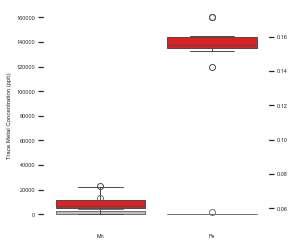

In [49]:
#threshold = 1000 
#filtered_outlier = fluid_outlier[fluid_outlier["Value"] < threshold]

fig, ax1 = plt.subplots(figsize=(4, 4))
plt.gca().set_facecolor('white') 

sns.boxplot(x='Metal', y='Value', data=fluid_outlier[fluid_outlier['Type'] == 'Concentration'], ax=ax1, color="silver")
ax2 = ax1.twinx()
sns.boxplot(x='Metal', y='Value', data=fluid_outlier[fluid_outlier['Type'] == 'Ratio'], ax=ax2, color="red")

# Hide EVERYTHING
ax1.set_ylabel('Trace Metal Concentration (ppb)')
ax2.set_ylabel(None)
ax1.set_xlabel(None)
ax1.grid(False)
ax2.grid(False)

plt.show()

### Correlation Matrix (fluids)

In [50]:
df_1 = df1.copy()
df_2 = df2.copy()

df_1['element'] = df_1['SiteID'] + '_' + df_1['Metal']
df_2['element'] = df_2['SiteID'] + '_' + df_2['Metal']

df_1 = df_1.drop(["Type", "Metal","SiteID"], axis=1).rename(columns={"Value": "Concentration"})
df_2 = df_2.drop(["Type", "Metal","SiteID"], axis=1).rename(columns={"Value": "Ratio"})

corr_df = pd.merge(left=df_1, right=df_2, on="element", how="left")
corr_df = corr_df[["element", "Concentration", "Ratio"]].set_index('element').dropna().T

corr_df.head()

element,CG_V,GA_V,ML_V,PI_V,CA_Mn,CF_Mn,CG_Mn,FE_Mn,GA_Mn,LS_Mn,...,GA_Mo,LS_Mo,ML_Mo,PI_Mo,SN_Mo,CF_W,GA_W,LS_W,PI_W,SN_W
Concentration,0.098000,8.444000,2.362000,583.930000,12.856000,13.245000,4.391000,1.043000,924.690000,3739.549000,...,7.096000,10.990000,0.066333,0.514333,15.457000,1.194000,8.441000,8.416000,0.840000,10.253000
Ratio,0.001243,0.000399,0.002107,0.000725,0.064306,0.059635,0.061529,0.072516,0.064825,0.056544,...,0.006084,0.009167,0.003161,0.003987,0.009215,0.002028,0.001695,0.001541,0.001087,0.002857


<Axes: xlabel='element', ylabel='element'>

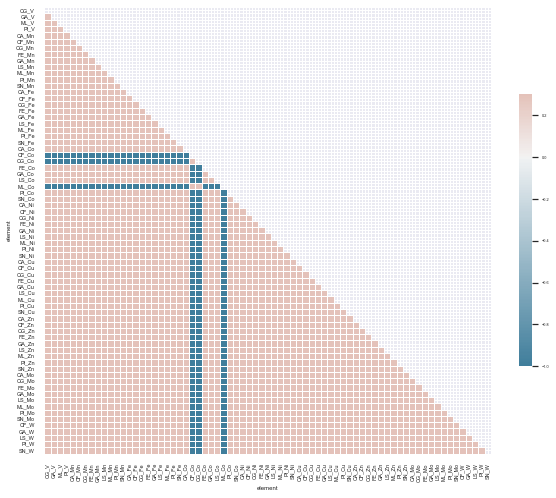

In [51]:
corr = corr_df.corr()

mask = np.triu(np.ones_like(corr, dtype=bool)) # hides upper triangle
f, ax = plt.subplots(figsize=(10, 10))

# Diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.set(font_scale=0.35)
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})

### Pairplot (fluids)

In [52]:
# Use same dataframe is combined bar plots
pivot = fluid_combined.pivot_table(index=['SiteID', 'Metal'], columns='Type', values='Value').reset_index()

# Use log10 values bc of ppb concentrations
pivot["log_concentration"] = np.log10(pivot["Concentration"])
pivot["log_abundance"] = np.log10(pivot["Ratio"])

# Relabel vars
pivot = pivot.rename(columns={
    "log_concentration": "log(Concentration)",
    "log_abundance": "log(Cofactor Usage)"
    })

# Giovannelli geochem colormap
color_mapping_url = "https://raw.githubusercontent.com/giovannellilab/geochem/main/inst/extdata/metal-color-mapping.csv"
color_mapping = pd.read_csv(color_mapping_url)
color_mapping = color_mapping.rename(columns={"element": "Metal"}).drop("type", axis=1)
color_mapping["color"] = color_mapping["color"].str.replace("#F7F7F7", "#c46f0e") # change iron from white
palette = dict(zip(color_mapping['Metal'], color_mapping['color']))

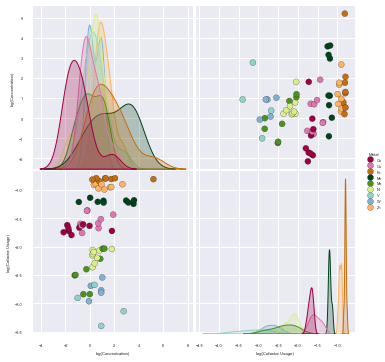

In [53]:
sns.pairplot(
    pivot, 
    hue='Metal', 
    vars=['log(Concentration)', 'log(Cofactor Usage)'], 
    palette=palette, # 'viridis' 'Paired_r'
    plot_kws={'edgecolor': 'black', 'linewidth': 0.2}, 
    #diag_kws={'edgecolor': 'black', 'linewidth': 0.1},
    height=2.5)

In [54]:
# Mean Absolute Deviation values

from sklearn.linear_model import LinearRegression

df = pivot.drop(["Concentration", "Ratio"], axis=1)
unique_metals = df['Metal'].unique()

for metal in unique_metals:
    df_metal = df[df['Metal'] == metal].dropna(subset=['log(Concentration)', 'log(Cofactor Usage)'])
    
    if len(df_metal) >= 2:
        X = df_metal['log(Concentration)'].values.reshape(-1, 1)
        Y = df_metal['log(Cofactor Usage)'].values
        
        model = LinearRegression()
        model.fit(X, Y)
        Y_pred = model.predict(X)
        
        deviations = np.abs(Y - Y_pred)  # Absolute deviations
        aad = np.mean(deviations)  # Average of absolute deviations
        
        print(f'Metal: {metal}, AAD = {aad:.4f}')

Metal: Co, AAD = 0.0534
Metal: Cu, AAD = 0.0991
Metal: Fe, AAD = 0.0125
Metal: Mn, AAD = 0.0249
Metal: Mo, AAD = 0.1810
Metal: Ni, AAD = 0.0785
Metal: V, AAD = 0.1923
Metal: W, AAD = 0.1141
Metal: Zn, AAD = 0.0312


### Bar comp. (sediments)

In [55]:
# Sediment cofactors:

data = pd.read_csv(os.path.join(os.path.join(DATA_DIR, "cofactors", "bin-ec-cofactor.csv")))
data = data.dropna()

bin_names = data["bin_name"].drop_duplicates()
seds = data["bin_name"].str.contains("_S_")
sbn = bin_names[seds]
sdf = data[seds]

# Using regex to capture the two-letter identifier
df1 = sdf.copy()
df1['SiteID'] = df1['bin_name'].str.extract(r'fasta([A-Z]{2})_(?:F|S)_extracted_bins')
df1.loc[:, 'SiteID'] = df1['SiteID'].str.strip().str.upper()

print(len(sbn), "sediment samples")


# Sediment metal distributions:

sm = pd.read_csv(os.path.join(DATA_DIR, "MAGs", "FENIX21", "sediment_metals.csv"))
df = sm.drop('ExpID', axis=1)

df.iloc[:, 2:] = df.iloc[:, 2:].apply(pd.to_numeric, errors='coerce')
sed_melted = df.melt(id_vars=["SiteID"], var_name="Element", value_name="Concentration")
sed_melted.dropna(subset=["Concentration"], inplace=True)

# Set cofactor counts for each site
df1["count"] = 1
df1_grouped = df1.groupby(['SiteID', 'cofactor'])['count'].sum().reset_index()

# Sum the number of cofactors for each site
site_total = df1_grouped.groupby(['SiteID'])['count'].sum().reset_index()
site_total = site_total.rename(columns={"count": "site_total"})

# Merge and calculate the normalized ratio for each site
sed_cofactors = pd.merge(left=df1_grouped, right=site_total, on="SiteID", how="left")
sed_cofactors["ratio"] = sed_cofactors.iloc[:,2].div(sed_cofactors.iloc[:,3])


# Format dataframes for plotting

df1 = sed_melted
df1['Type'] = 'Concentration'
df1 = df1.rename(columns={'Element': 'Metal', 'Concentration': 'Value'})

df2 = sed_cofactors.drop(['count', 'site_total'], axis=1)
df2['Type'] = 'Ratio'
df2 = df2.rename(columns={'cofactor': 'Metal', 'ratio': 'Value'})

sed_combined = pd.concat([df1, df2])

# Filter for the overlap between cofactors and available concentrations: 

sediment_metals = sed_melted["Element"].to_list()
sm_list = set(sediment_metals)
filter1 = sed_combined["Metal"].isin(sm_list)

metal_cofactors = sed_cofactors["cofactor"].to_list()
mc_list = set(metal_cofactors)
filter2 = sed_combined["Metal"].isin(mc_list)

#sediment_metals = ["V", "Mn", "Co", "Ni", "Cu", "Mo", "W"] # in place of filters 1 & 2
#filter3 = sed_combined["Metal"].isin(sediment_metals)

sed_combined = sed_combined[filter1 & filter2] #filter1 & filter2 ... filter3


# Toggle filter for high concentration metals
omit = ["Fe"]
omm = sed_combined["Metal"].isin(omit)

sed_filter = sed_combined[~omm]
sed_outlier = sed_combined[omm]

105 sediment samples


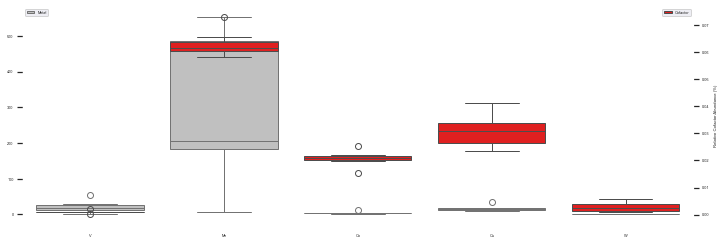

In [56]:
fig, ax1 = plt.subplots(figsize=(12, 4))
plt.gca().set_facecolor('white') 

# Boxplot for Concentration
sns.boxplot(x='Metal', y='Value', data=sed_filter[sed_filter['Type'] == 'Concentration'], ax=ax1, color="silver") #hue='Type', palette="light:g"
ax1.set_ylabel(None) #'Trace Metal Concentration (ppb)'
ax1.set_xlabel(None)

# Create a second y-axis sharing the same x-axis
ax2 = ax1.twinx()
sns.boxplot(x='Metal', y='Value', data=sed_filter[sed_filter['Type'] == 'Ratio'], ax=ax2, color="red") #hue='Type', palette="Set1"
ax2.set_ylabel('Relative Cofactor Abundance (%)')

ax1.legend(["Metal"], loc='upper left')
ax2.legend(["Cofactor"], loc='upper right')

ax1.grid(False)
ax2.grid(False)

#ax1.set_ylim(0, 60)
#ax2.set_ylim(0, 0.15)

#plt.title('Fenix21 Sediment [Metal] and Cofactor Distribution')
plt.show()

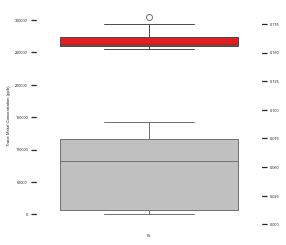

In [57]:
#threshold = 4000 
#sed_outlier = sed_outlier[sed_outlier["Value"] < threshold]

fig, ax1 = plt.subplots(figsize=(4, 4))
plt.gca().set_facecolor('white') 

sns.boxplot(x='Metal', y='Value', data=sed_outlier[sed_outlier['Type'] == 'Concentration'], ax=ax1, color="silver") #hue='Type', palette="light:g"
ax2 = ax1.twinx()
sns.boxplot(x='Metal', y='Value', data=sed_outlier[sed_outlier['Type'] == 'Ratio'], ax=ax2, color="red") #hue='Type', palette="Set1"

# Hide EVERYTHING
ax1.set_ylabel('Trace Metal Concentration (ppb)')
ax2.set_ylim(0,0.19)
ax2.set_ylabel(None)
ax1.set_xlabel(None)
ax1.grid(False)
ax2.grid(False)

plt.show()

### Pairplot (sediments)

c:\Users\jakel\anaconda3\envs\media\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning:

divide by zero encountered in log10



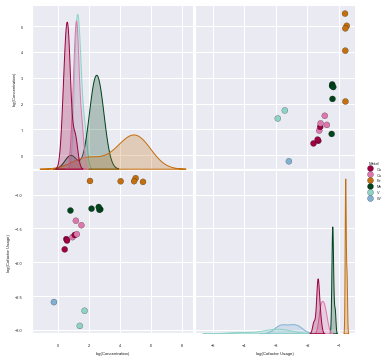

In [58]:
# Use same dataframe is combined bar plots
pivot = sed_combined.pivot_table(index=['SiteID', 'Metal'], columns='Type', values='Value').reset_index()

# Use log10 values bc of ppb concentrations
pivot["log(Concentration)"] = np.log10(pivot["Concentration"])
pivot["log(Cofactor Usage)"] = np.log10(pivot["Ratio"])

# Get rid of -inf values from log(0)
pivot["log(Concentration)"] = pivot["log(Concentration)"].astype(str)
pivot["log(Concentration)"] = pivot["log(Concentration)"].str.replace("-inf", "NaN")
pivot["log(Concentration)"] = pivot["log(Concentration)"].astype("f8")

sns.pairplot(
    pivot, 
    hue='Metal', 
    vars=['log(Concentration)', 'log(Cofactor Usage)'], 
    palette=palette, # 'viridis' 'Paired_r'
    plot_kws={'edgecolor': 'black', 'linewidth': 0.2}, 
    #diag_kws={'edgecolor': 'black', 'linewidth': 0.1},
    height=2.5)

In [59]:
# Mean Absolute Deviation values

from sklearn.linear_model import LinearRegression

df = pivot.drop(["Concentration", "Ratio"], axis=1)
unique_metals = df['Metal'].unique()

for metal in unique_metals:
    df_metal = df[df['Metal'] == metal].dropna(subset=['log(Concentration)', 'log(Cofactor Usage)'])
    
    if len(df_metal) >= 2:
        X = df_metal['log(Concentration)'].values.reshape(-1, 1)
        Y = df_metal['log(Cofactor Usage)'].values
        
        model = LinearRegression()
        model.fit(X, Y)
        Y_pred = model.predict(X)
        
        deviations = np.abs(Y - Y_pred)  # Absolute deviations
        aad = np.mean(deviations)  # Average of absolute deviations
        
        print(f'Metal: {metal}, AAD = {aad:.4f}')

Metal: Co, AAD = 0.0417
Metal: Cu, AAD = 0.0697
Metal: Fe, AAD = 0.0144
Metal: Mn, AAD = 0.0122
Metal: V, AAD = 0.0000


## Ions and Transporters

### Filtering for transporters

In [60]:
ml_input = pd.read_csv(os.path.join(DATA_DIR, "model", "ml_input.csv"), low_memory=False)

ec7 = ml_input["ec"].str.startswith("7.")
filter = ml_input["ec"].str.contains("-")
transporters = ml_input[ec7 & ~filter] #ec7 & ### PAY ATTENTION TO THIS

print(len(transporters), "transporter annotations:")

# Merge with cofactor information
cf = pd.read_csv(os.path.join(DATA_DIR, "cofactors", "cofactors-taxa.csv"), low_memory=False)
cf = cf.rename(columns={"Query EC": "ec", "CofactorFinal": "cofactor", "Protein names": "proteins", "Function [CC]": "function"})
cf = cf[["ec", "cofactor", "proteins", "function"]]

tran_df = pd.merge(left=transporters, right=cf, on="ec", how="left")

tran_ec = tran_df["ec"].to_list()
ec_set = set(tran_ec)
tran_co = tran_df["cofactor"].to_list()
co_set = set(tran_co)

print(len(ec_set), "unique transporters &", len(co_set)-1, "unique cofactors")
print("Cofactors:", co_set)

39097 transporter annotations:
77 unique transporters & 7 unique cofactors
Cofactors: {'Zn', 'FMN', 'Fe', nan, 'FAD', 'Mg', 'Cu', 'S'}


In [61]:
# Separate into training and test sets
bins = tran_df["source"].str.contains("KBase")

train = tran_df[~bins].drop(["media_id", "species", "taxon_id", "source"], axis=1)
test = tran_df[bins].drop(["media_id", "species", "source"], axis=1)

print("All EC Class 7 annotations:")
train.head()

All EC Class 7 annotations:


,ec,cofactor,proteins,function
0,7.4.2.8,Zn,Protein translocase subunit SecA (EC 7.4.2.8),"FUNCTION: Required for protein export, interac..."
1,7.1.2.2,NaN,NaN,NaN
2,7.1.2.2,NaN,NaN,NaN
3,7.6.2.14,NaN,NaN,NaN
4,7.1.1.3,Cu,Cytochrome bo(3) ubiquinol oxidase subunit 1 (...,FUNCTION: Cytochrome bo(3) ubiquinol oxidase i...


In [62]:
data = train.copy() 
data = data.astype(str)

keys = ["import ", "export", "symport", "pump", "porin", "channel "] #careful here, e.g., import can grab the word "important" #"transloc", 
filter = data["function"].str.contains('|'.join(keys))
poi = data[filter]

poi_list = poi["proteins"].to_list()
poi_set = set(poi_list)

print("Keys:", keys)
print(len(poi), "total potential annotations of interest")
print(len(poi_set), "unique names")
poi = poi.drop_duplicates()

print("EC:7.-... with keywords:")
poi.head()

Keys: ['import ', 'export', 'symport', 'pump', 'porin', 'channel ']
11322 total potential annotations of interest
7 unique names
EC:7.-... with keywords:


,ec,cofactor,proteins,function
0,7.4.2.8,Zn,Protein translocase subunit SecA (EC 7.4.2.8),"FUNCTION: Required for protein export, interac..."
4,7.1.1.3,Cu,Cytochrome bo(3) ubiquinol oxidase subunit 1 (...,FUNCTION: Cytochrome bo(3) ubiquinol oxidase i...
5,7.1.1.3,Fe,Cytochrome bo(3) ubiquinol oxidase subunit 1 (...,FUNCTION: Cytochrome bo(3) ubiquinol oxidase i...
96,7.1.1.9,Cu,Cbb3-type cytochrome c oxidase subunit CcoN1 (...,FUNCTION: Cbb3-type cytochrome c oxidase is th...
97,7.1.1.9,Fe,Cbb3-type cytochrome c oxidase subunit CcoN1 (...,FUNCTION: Cbb3-type cytochrome c oxidase is th...


In [63]:
# Ions of interest
ions = ["Cl ", "Cl-", "chlorine", "chloride", "-chloride",
       "Br(", "Br-", "bromine", "bromide", "-bromide",
       "NO3", "NO3-", "nitrate", "-nitrate",
       "SO4", "SO42-", "sulfate", "-sulfate",
       "PO4", "PO4-", "PO42-", "PO43-", "-phosphate", 
       "Na", "Na+", "sodium", "sodium-",
       "NH4", "NH4+", "ammonium", "ammonium-",
       "K ", "K(", "K+", "potassium", "potassium-",
       "Mg", "Mg2+", "magnesium", "magnesium-",
       "Ca ", "Ca(", "Ca2+", "calcium", "calcium-", "calcite", "-calcite", "-carbonate", "bicarbonate",
       "+"
       ]

pattern = '|'.join(map(re.escape, ions))
nm_filter = poi['proteins'].str.contains(pattern, case=False, na=False)
fn_filter = poi['function'].str.contains(pattern, case=False, na=False)

name_df = poi[nm_filter]
func_df = poi[fn_filter]
both = poi[nm_filter | fn_filter]

print(len(name_df), "names, and", len(func_df), "functions contain an ion keyword")

5 names, and 7 functions contain an ion keyword


In [64]:
# Focus on names for now:
df = both.copy() 

# Function to find the keyword in a string
def find_keyword(text):
    match = re.search(pattern, text, re.IGNOrgECASE)
    if match:
        return match.group(0)  # Return the matched keyword
    return None

#df['ion'] = df['function'].apply(find_keyword) # need to write better parsing
#df.to_csv("~/Desktop/ion_list.csv", index=False)

df = df.drop('cofactor', axis=1)
df = df.drop_duplicates()

print("EC:7..., keywords, and ion keys:")
df

EC:7..., keywords, and ion keys:


,ec,proteins,function
0,7.4.2.8,Protein translocase subunit SecA (EC 7.4.2.8),"FUNCTION: Required for protein export, interac..."
4,7.1.1.3,Cytochrome bo(3) ubiquinol oxidase subunit 1 (...,FUNCTION: Cytochrome bo(3) ubiquinol oxidase i...
96,7.1.1.9,Cbb3-type cytochrome c oxidase subunit CcoN1 (...,FUNCTION: Cbb3-type cytochrome c oxidase is th...
492,7.1.3.1,K(+)-insensitive pyrophosphate-energized proto...,FUNCTION: Proton pump that utilizes the energy...
806,7.2.3.1,K(+)-stimulated pyrophosphate-energized sodium...,FUNCTION: Sodium pump that utilizes the energy...
1223,7.2.2.8,Copper-exporting P-type ATPase (EC 7.2.2.8) (C...,FUNCTION: Couples the hydrolysis of ATP with t...
14402,7.2.2.3,Sodium/potassium exporting P-type ATPase 1 (EC...,FUNCTION: Catalyzes the hydrolysis of ATP coup...


### Mixed bar-scatter (normalized, EC:7 vs ions)

In [65]:
df1 = test.copy()
print(len(df1), "bin annotations")

df1['SiteID'] = df1['taxon_id'].str.extract(r'fasta([A-Z]{2})_(?:F|S)_extracted_bins')
df1.loc[:, 'SiteID'] = df1['SiteID'].str.strip().str.upper()

# Set cofactor counts for each site
df1["count"] = 1
df1_grouped = df1.groupby(['SiteID', 'taxon_id', 'ec', 'cofactor'])['count'].sum().reset_index()

# Sum the number of cofactors for each site
site_total = df1_grouped.groupby(['SiteID'])['count'].sum().reset_index()
site_total = site_total.rename(columns={"count": "ec7_total"})


# Merge and calculate the normalized ratio for each site
norm = pd.merge(left=df1_grouped, right=site_total, on="SiteID", how="left")

norm = norm.drop(['cofactor', 'taxon_id', 'ec', 'count'], axis=1)
norm = norm.drop_duplicates()

sum1 = norm["ec7_total"].sum()
norm["ratio"] = norm["ec7_total"].div(sum1)

bin_counts = {
    "SiteID": ["BA","CA","CF","CG","FE","GA","LS","ML","PI","SI","SN","SP","VR"],
    "n_bins": [51,4,7,11,2,15,48,2,14,34,26,23,10]
}

bin_counts_df = pd.DataFrame(bin_counts)
merged_bins = pd.merge(left=norm, right=bin_counts_df, on="SiteID", how="left")

merged_bins["ratio2"] = merged_bins["ec7_total"].div(merged_bins["n_bins"])
merged_bins.head()

12117 bin annotations


,SiteID,ec7_total,ratio,n_bins,ratio2
0,BA,1888,0.213430,51,37.019608
1,CA,137,0.015487,4,34.250000
2,CF,175,0.019783,7,25.000000
3,CG,314,0.035496,11,28.545455
4,FE,100,0.011305,2,50.000000


In [66]:
master = pd.read_csv(os.path.join(DATA_DIR, "model", "ml_input.csv"), low_memory=False)
bins = master["source"].str.contains("KBase")

# Filter for bins
test_set = master[bins].copy()

# Strip SiteIDs
test_set['SiteID'] = test_set['taxon_id'].str.extract(r'fasta([A-Z]{2})_(?:F|S)_extracted_bins')
test_set.loc[:, 'SiteID'] = test_set['SiteID'].str.strip().str.upper()
test_set = test_set.drop(["media_id", "species", "source"], axis=1)

test_set.head()

,taxon_id,ec,SiteID
1661523,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,2.1.1.297,BA
1661524,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,6.1.1.21,BA
1661525,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,2.7.1.33,BA
1661526,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,2.8.1.13,BA
1661527,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,2.6.1.42,BA


In [67]:
# Normalize abundances
test_set["count"] = 1
grouped_test = test_set.groupby(['SiteID'])['count'].sum().reset_index()
grouped_test = grouped_test.rename(columns={"count": "site_total"})

# Formate
norm2 = pd.merge(left=test_set, right=grouped_test, on="SiteID", how="left")
norm2 = norm2.drop(['taxon_id', 'ec', 'count'], axis=1)
norm2 = norm2.drop_duplicates()

# Merge
merged = pd.merge(left=norm, right=norm2, on="SiteID", how="left")
merged["ratio"] = merged["ec7_total"].div(merged["site_total"])
merged.head()

,SiteID,ec7_total,ratio,site_total
0,BA,1888,0.088361,21367.0
1,CA,137,0.099275,1380.0
2,CF,175,0.074153,2360.0
3,CG,314,0.079173,3966.0
4,FE,100,0.082102,1218.0


ValueError: Could not interpret value `Concentration` for `y`. An entry with this name does not appear in `data`.

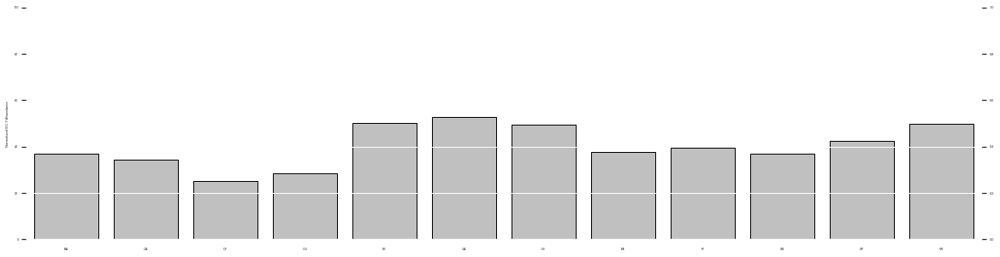

In [68]:
fig, ax1 = plt.subplots(figsize=(20, 5))
plt.gca().set_facecolor('white') 

sns.barplot(x="SiteID", y="ratio2", data=merged_bins, ax=ax1, color="silver", edgecolor='black') #or ratio2, merged_bins
ax1.set_xlabel('')
ax1.set_ylabel('Normalized EC:7 Abundance')
ax1.set_ylim(0, 100)
ax1.tick_params(axis='y')
ax1.grid(False)

ax2 = ax1.twinx()
sns.scatterplot(x="SiteID", y="Concentration", hue="Element", palette="Spectral", data=merged, s=80, edgecolor='black', ax=ax2)
ax2.set_ylabel('Major Ion Concentrations (ppm)')
ax2.tick_params(axis='y')
ax2.legend(loc="upper right")
ax2.grid(False)

plt.show()

### Mixed bar-scatter (raw abundances)

In [49]:
# EC Class 7 (test set)
data = test.copy()
data = data.rename(columns={"taxon_id": "bin_name"})

data['SiteID'] = data['bin_name'].str.extract(r'fasta([A-Z]{2})_(?:F|S)_extracted_bins')
data.loc[:, 'SiteID'] = data['SiteID'].str.strip().str.upper()

# Fluid ion distributions:
ion_df = pd.read_csv(os.path.join(DATA_DIR, "MAGs", "FENIX21", "major_ions.csv"))
df = ion_df.copy()

df.iloc[:, 1:] = df.iloc[:, 1:].apply(pd.to_numeric, errors='coerce')
df_melted = df.melt(id_vars=["SiteID"], var_name="Element", value_name="Concentration")
df_melted.dropna(subset=["Concentration"], inplace=True)

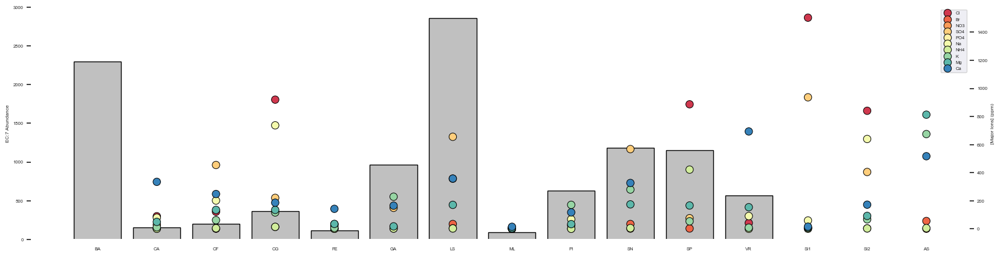

In [50]:
# Data for bar plots
data["count"] = 1
abundance_by_siteid = data.groupby('SiteID')['count'].sum()
bardf = pd.DataFrame(abundance_by_siteid)

fig, ax1 = plt.subplots(figsize=(20, 5))
plt.gca().set_facecolor('white') 

sns.barplot(x="SiteID", y="count", data=bardf, estimator=sum, ax=ax1, color="silver", edgecolor='black')
ax1.set_xlabel('')
ax1.set_ylabel('EC:7 Abundance')
ax1.tick_params(axis='y')
ax1.grid(False)

ax2 = ax1.twinx()
sns.scatterplot(x="SiteID", y="Concentration", hue="Element", palette="Spectral", data=df_melted, s=80, edgecolor='black', ax=ax2)
ax2.set_ylabel('[Major Ions] (ppm)')
ax2.tick_params(axis='y')
ax2.legend(loc="upper right")
ax2.grid(False)

plt.show()

### Bar graph (fluid ions)

In [197]:
# EC Class 7 (test set)
data = test.copy()
data = data.rename(columns={"taxon_id": "bin_name"})

data['SiteID'] = data['bin_name'].str.extract(r'fasta([A-Z]{2})_(?:F|S)_extracted_bins')
data.loc[:, 'SiteID'] = data['SiteID'].str.strip().str.upper()

# Fluid ion distributions:
ion_df = pd.read_csv(os.path.join(DATA_DIR, "MAGs", "FENIX21", "major_ions.csv"))
df = ion_df.copy()

df.iloc[:, 1:] = df.iloc[:, 1:].apply(pd.to_numeric, errors='coerce')
df_melted = df.melt(id_vars=["SiteID"], var_name="Element", value_name="Concentration")
df_melted.dropna(subset=["Concentration"], inplace=True)

C:\Users\jakel\AppData\Local\Temp\ipykernel_3948\3081433455.py:11: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



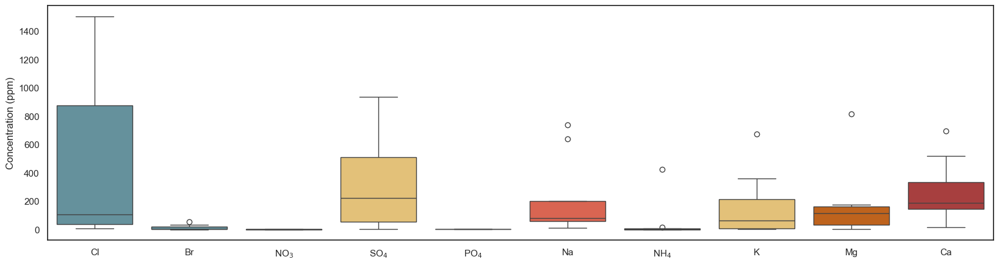

In [220]:
plt.figure(figsize=(20, 5))
plt.gca().set_facecolor('white') 

colors = colors = ["#5c96a5", "#5c96a570","#5c96a540", "#f5c767", "#f5c76770", "#ef553b", "#f5c76710", "#f5c76710", "#d95f02", "#b82e2e"]

sns.boxplot(x="Element", y="Concentration", data=df_melted, hue="Element", palette=colors)  # hue="Element", palette="BuGn" 
#plt.title("Major Ion Distributions")

# Modify the x-tick labels to display subscripts
ax1 = plt.gca()
ax1.set_xticklabels([label.get_text().replace("O4", "O$_4$").replace("O3", "O$_3$").replace("H4", "H$_4$") for label in ax1.get_xticklabels()])
ax1.set_xlabel('')
ax1.set_ylabel('Concentration (ppm)')

plt.show()

# Taxonomy

## Training Set

Media species names

In [52]:
media = pd.read_csv(os.path.join(DATA_DIR, "mediadive", "mediadive-all.csv"), sep=";")
media_species = media[["media_id", "name", "species"]]
media_species = media_species.dropna()
print(len(media_species))
media_species.head()

29870


,media_id,name,species
1,1a,REACTIVATION WITH LIQUID MEDIUM 1,Comamonas testosteroni
2,1a,REACTIVATION WITH LIQUID MEDIUM 1,Delftia acidovorans
3,1a,REACTIVATION WITH LIQUID MEDIUM 1,Acidovorax delafieldii
4,1a,REACTIVATION WITH LIQUID MEDIUM 1,Pseudomonas putida
5,1a,REACTIVATION WITH LIQUID MEDIUM 1,Pseudomonas koreensis


ML Output (raw output, removed bins)

In [53]:
# Training output with clustering and classification
train_df = pd.read_csv(os.path.join(DATA_DIR, 'model', 'train-output.csv'))

# BacDive taxonomy information
bacdive_df = pd.read_csv(os.path.join(DATA_DIR, "bacdive", "bacdive-all.csv"), low_memory=False)
bd_taxonomy = bacdive_df[["taxon_id", "domain", "phylum", "class", "order", "family", "genus", "species"]]

neighbors_list = train_df["taxon_id"].to_list()
neighbors = bd_taxonomy["taxon_id"].isin(neighbors_list)
bd_taxonomy = bd_taxonomy[neighbors]
bd_taxonomy = bd_taxonomy.drop_duplicates()

# Merge for neighbor_taxonomy information (multiple taxonomic classifications for some taxon_id's)
train_taxa = pd.merge(left=train_df, right=bd_taxonomy, on="taxon_id", how="left")
train_taxa = train_taxa.drop_duplicates()

#train_taxa.to_csv(os.path.join(DATA_DIR, "model", "train-taxa.csv"), index=False)
train_taxa = train_taxa[["Target", "taxon_id", "domain", "phylum", "class", "order", "family","genus", "species"]]
train_taxa = train_taxa.rename(columns={
    "domain": "Domain",
    "phylum": "Phylum",
    "class": "Class",
    "order": "Order",
    "family": "Family", 
    "genus": "Genus",
    "species": "Species"
})

print(len(train_df), "training samples,", len(train_taxa), "taxonomic classifications")
print("Important! Expands for multiple taxonomic-level classifications for a single taxon_id, use og frame for mapping")

print(len(train_taxa))
train_taxa.head()

8464 training samples, 25006 taxonomic classifications
Important! Expands for multiple taxonomic-level classifications for a single taxon_id, use og frame for mapping
25006


,Target,taxon_id,Domain,Phylum,Class,Order,Family,Genus,Species
0,J346,100.0,Bacteria,Proteobacteria,Alphaproteobacteria,Caulobacterales,Caulobacteraceae,Phenylobacterium,Phenylobacterium panacis
1,J346,100.0,Bacteria,Actinobacteria,Actinobacteria,Actinomycetales,Mycobacteriaceae,Mycobacterium,Mycobacterium triplex
2,J346,100.0,Bacteria,Actinobacteria,Actinobacteria,Actinomycetales,Mycobacteriaceae,Mycobacterium,Mycobacterium branderi
3,J386,100.0,Bacteria,Proteobacteria,Alphaproteobacteria,Caulobacterales,Caulobacteraceae,Phenylobacterium,Phenylobacterium panacis
4,J386,100.0,Bacteria,Actinobacteria,Actinobacteria,Actinomycetales,Mycobacteriaceae,Mycobacterium,Mycobacterium triplex


Taxonomy of K-Neighbors (nearest neighbors of bins)

In [54]:
# Model output with clustering and classification
model_df = pd.read_csv(os.path.join(DATA_DIR, 'model', 'ml-model-output.csv'))
model_df = model_df.rename(columns={"Media Cluster": "media_cluster", "taxon_id": "bin", "neighbor_taxon_id": "taxon_id"})

# BacDive taxonomy information
bacdive_df = pd.read_csv(os.path.join(DATA_DIR, "bacdive", "bacdive-all.csv"), low_memory=False)
bd_taxonomy = bacdive_df[["taxon_id", "domain", "phylum", "class", "order", "family", "genus", "species"]]

neighbors_list = model_df["taxon_id"].to_list()
neighbors = bd_taxonomy["taxon_id"].isin(neighbors_list)
bd_taxonomy = bd_taxonomy[neighbors]
bd_taxonomy = bd_taxonomy.drop_duplicates()

# Merge for neighbor_taxonomy information (multiple taxonomic classifications for some taxon_id's)
model_neighbors = pd.merge(left=model_df, right=bd_taxonomy, on="taxon_id", how="left")

model_neighbors.to_csv(os.path.join(DATA_DIR, "model", "test-taxa.csv"), index=False)
model_neighbors.head()

,Component 1,Component 2,Component 3,Component 4,Component 5,Component 6,Component 7,Component 8,Component 9,Component 10,...,neighbor_media_id,taxon_id,media_cluster,domain,phylum,class,order,family,genus,species
0,9.427101,5.556786,5.026694,4.71825,4.642046,4.58009,4.598486,4.929774,5.9216,6.780723,...,J654,438.0,NaN,Bacteria,Actinobacteria,Actinobacteria,Actinomycetales,Nocardiopsaceae,Haloactinospora,Haloactinospora alba
1,9.427101,5.556786,5.026694,4.71825,4.642046,4.58009,4.598486,4.929774,5.9216,6.780723,...,J654,438.0,NaN,Bacteria,Proteobacteria,Betaproteobacteria,Burkholderiales,Sutterellaceae,Sutterella,Sutterella megalosphaeroides
2,9.427101,5.556786,5.026694,4.71825,4.642046,4.58009,4.598486,4.929774,5.9216,6.780723,...,J654,438.0,NaN,Bacteria,Proteobacteria,Betaproteobacteria,Burkholderiales,Sutterellaceae,Mesosutterella,Mesosutterella multiformis
3,9.427101,5.556786,5.026694,4.71825,4.642046,4.58009,4.598486,4.929774,5.9216,6.780723,...,J654,438.0,NaN,Bacteria,Planctomycetes,Phycisphaerae,Tepidisphaerales,Tepidisphaeraceae,Tepidisphaera,Tepidisphaera mucosa
4,9.427101,5.556786,5.026694,4.71825,4.642046,4.58009,4.598486,4.929774,5.9216,6.780723,...,J654,438.0,NaN,Bacteria,Firmicutes,Clostridia,Eubacteriales,Clostridiaceae,Terrisporobacter,Terrisporobacter petrolearius


## Test Set (Fenix21)

In [55]:
mags = pd.read_csv("~/Desktop/media_mapping/prediction_test/TEST1.csv") #TODO: UPDATE!
mag_tax = pd.read_csv("~/Desktop/fenix21/GTDB-k/all-taxonomy.csv")
mag_tax.head()

,User Genome,Domain,Phylum,Class,Order,Family,Genus,Species
0,Bin.001.fastaPI_F_extracted_bins.AssemblySet.f...,Bacteria,Pseudomonadota,Gammaproteobacteria,Acidithiobacillales,Acidithiobacillaceae,Acidithiobacillus,Acidithiobacillus ferridurans
1,Bin.006.fastaPI_S_extracted_bins.AssemblySet.f...,Bacteria,Pseudomonadota,Gammaproteobacteria,Acidithiobacillales,Acidithiobacillaceae,Acidithiobacillus,Acidithiobacillus ferridurans
2,Bin.004.fastaPI_F_extracted_bins.AssemblySet.f...,Bacteria,Pseudomonadota,Gammaproteobacteria,Acidithiobacillales,Acidithiobacillaceae,Acidithiobacillus,Acidithiobacillus thiooxidans
3,Bin.009.fastaPI_S_extracted_bins.AssemblySet.f...,Bacteria,Pseudomonadota,Gammaproteobacteria,Acidithiobacillales,Acidithiobacillaceae,Acidithiobacillus,Acidithiobacillus thiooxidans
4,Bin.002.fastaPI_F_extracted_bins.AssemblySet.f...,Bacteria,Pseudomonadota,Gammaproteobacteria,Acidithiobacillales,Acidithiobacillaceae,Acidithiobacillus_B,Acidithiobacillus_B sulfuriphilus


In [56]:
phylum1 = train_taxa["Phylum"].to_list()
phylum2 = mag_tax["Phylum"].to_list()
ph1 = set(phylum1)
ph2 = set(phylum2)

class1 = train_taxa["Class"].to_list()
class2 = mag_tax["Class"].to_list()
cl1 = set(class1)
cl2 = set(class2)

order1 = train_taxa["Order"].to_list()
order2 = mag_tax["Order"].to_list()
or1 = set(order1)
or2 = set(order2)

family1 = train_taxa["Family"].to_list()
family2 = mag_tax["Family"].to_list()
fa1 = set(family1)
fa2 = set(family2)

genus1 = train_taxa["Genus"].to_list()
genus2 = mag_tax["Genus"].to_list()
ge1 = set(genus1)
ge2 = set(genus2)

species1 = train_taxa["Species"].to_list()
species2 = mag_tax["Species"].to_list()
sp1 = set(species1)
sp2 = set(species2)

In [57]:
phylum_overlap = ph1.intersection(ph2)
class_overlap = cl1.intersection(cl2)
order_overlap = or1.intersection(or2)
family_overlap = fa1.intersection(fa2)
genus_overlap = ge1.intersection(ge2)
species_overlap = sp1.intersection(sp2)

print(len(ph2), phylum_overlap)
print(len(cl2), class_overlap)
print(len(or2), order_overlap)
print(len(fa2), family_overlap)
print(len(ge2), genus_overlap)
print(len(sp2), species_overlap)

39 {'Actinomycetota', 'Nitrospirota', 'Pseudomonadota', 'Bacteroidota', 'Bacillota'}
67 {'Elusimicrobia', 'Gammaproteobacteria', 'Gemmatimonadetes', 'Verrucomicrobiae', 'Anaerolineae', 'Ignavibacteria', 'Alphaproteobacteria', 'Phycisphaerae', 'Thermodesulfobacteria', 'Thermoprotei', 'Nitrososphaeria', 'Deinococci', 'Aquificae', 'Thermodesulfovibrionia', 'Bacilli', 'Bacteroidia', 'Planctomycetia', 'Chloroflexia', 'Thermotogae'}
102 {'Anaerolineales', 'Aquificales', 'Rhodobacterales', 'Thermodesulfovibrionales', 'Pirellulales', 'Sphingobacteriales', 'Propionibacteriales', 'Chromatiales', 'Methylococcales', 'Flavobacteriales', 'Thermodesulfobacteriales', 'Campylobacterales', 'Sphingomonadales', 'Pseudomonadales', 'Burkholderiales', 'Thiotrichales', 'Desulfurellales', 'Acidithiobacillales', 'Elusimicrobiales', 'Xanthomonadales', 'Bacteroidales', 'Deinococcales', 'Gemmatimonadales', 'Rhizobiales'}
124 {'Sphingobacteriaceae', 'Acidithiobacillaceae', 'Acidobacteriaceae', 'Alteromonadaceae', '

In [58]:
#TODO: mag_tax has many NA values for many levels of taxonomy, could show the distributions using the alpha diversity bars

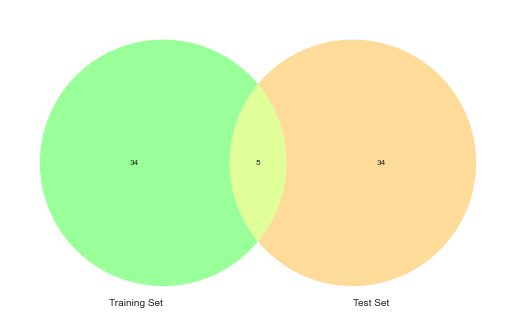

In [59]:
venn2(
    subsets=[ph1, ph2],
    set_labels=["Training Set", "Test Set"],
    set_colors=["lime", "orange"]
)

# Model Visualization

## Training Set

In [3]:
# Model outputs
train = pd.read_csv(os.path.join(DATA_DIR, "model", "train-output.csv"))
test = pd.read_csv(os.path.join(DATA_DIR, "model", "test-output.csv"))
print(len(train), "training points,", len(test), "test points")

# Highest-importance features
dim1 = "Component 38" 
dim2 = "Component 33"

# Initiate Sliders
steps = []
for i in range(11):  # 0 to 1 in steps of 0.1
    step = dict(
        method="restyle",
        args=[{"marker.opacity": [i/20]}, [0]],  # Adjust opacity of the training points trace only (trace index [0])
        label=str(i/20)
    )
    steps.append(step)

sliders = [dict(
    active=1,  # Initial value corresponding to opacity=0.1 (i.e., 1st step)
    currentvalue={"prefix": "Opacity: "},
    pad={"t": 50},
    steps=steps
)]

8464 training points, 247 test points


### Scatter (clusters)

In [4]:
fig = px.scatter(
    data_frame = train,
    x = dim1,
    y = dim2, 
    color = "Media Cluster", 
    hover_data = ["taxon_id", "Target", "KMeans Cluster"], 
    opacity = 1,
    width=500, 
    height=500
) 

fig.add_trace(
    go.Scatter(
        x=test[dim1],  # x coordinates
        y=test[dim2],  # y coordinates
        mode='markers',
        marker=dict(
            color="black",  
            size=5,  
            opacity=1.0 
        ),
        text=test["taxon_id"]  # marker hover text
    )
)

fig.update_layout(
    sliders=sliders,
    title="40 Dimensions, Training & Test Model Outputs",
    template="plotly_white",
    showlegend=False,
    autosize=True
)

fig.show()

### Scatter (taxonomy)

In [5]:
# Metadata and subsets: 
train = pd.read_csv(os.path.join(DATA_DIR, "model", "train-taxa.csv"))
test = pd.read_csv(os.path.join(DATA_DIR, "model", "output-metadata.csv")) # comes from Bin metadata section, this was added post-
print(len(train), "training points,", len(test), "test points")

# Weird formatting stuff for metadata
test["temp"] = test["temp"].astype(str)
test["ph"] = test["ph"].astype(str)

temp = test.copy()
temp["temp"] = temp["temp"].dropna()
temp_nan = temp["temp"].str.contains("nan")
temp = temp[~temp_nan]
temp["temp"] = temp["temp"].astype("f8")

ph = test.copy()
ph["ph"] = ph["ph"].dropna()
ph_nan = ph["ph"].str.contains("nan")
ph = ph[~ph_nan]
ph["ph"] = ph["ph"].astype("f8")

print(len(temp), "points with temperature data", len(ph), "points with pH data")

25006 training points, 247 test points
190 points with temperature data 190 points with pH data


In [22]:
fig = px.scatter(
    data_frame = train,
    x = dim1,
    y = dim2, 
    color = "class",
    hover_data = ["taxon_id", "Target", "KMeans Cluster"],
    #opacity = 0.5,
    #title = "Class-Level Taxonomy, Training Set",
    template="plotly_white",
    width=500, 
    height=500
) 

fig.update_layout(showlegend=True)

fig.show()

Note: no strong correlation in the way taxonomic classes cluster -- could potentially suggest that to categorize metabolism in this way is good, considering taxa don't share the same "metabolic features", or could simply be model bias due to the annotations used.

## Test Set (Fenix21)

### Scatter (metadata)

In [23]:
fig = px.scatter(
    data_frame = test,
    x = dim1,
    y = dim2, 
    color = "SiteID",
    #color_discrete_sequence=px.colors.sequential.Agsunset,
    hover_data = ["bin", "RF Classify"],
    #opacity = 0.2,
    #title = "SiteID, Test Set",
    template="plotly_white",
    width=500, 
    height=500
) 

fig.show()

In [9]:
fig = px.scatter(
    data_frame = temp,
    x = dim1,
    y = dim2, 
    color = "temp",
    #color_continuous_scale=px.colors.cyclical.IceFire,
    color_continuous_scale=px.colors.sequential.thermal,
    hover_data = ["bin", "RF Classify"],
    #opacity = 0.2,
    #title = "Temperature, Test Set",
    template="plotly_white",
    width=500, 
    height=500
) 

fig.show()

In [10]:
fig = px.scatter(
    data_frame = ph,
    x = dim1,
    y = dim2, 
    color = "ph",
    color_continuous_scale=px.colors.sequential.thermal,
    hover_data = ["bin", "RF Classify"],
    #opacity = 0.2,
    #title = "pH, Test Set",
    template="plotly_white",
    width=500, 
    height=500
) 

fig.show()

Note: no strong or apparently visible correlation in any of these features, suggesting metabolic features are independent of these conditions

In [11]:
fig = px.scatter(
    data_frame = ph,
    x = dim1,
    y = dim2, 
    color = "waterType",
    color_continuous_scale=px.colors.sequential.thermal,
    hover_data = ["bin", "RF Classify"],
    #opacity = 0.2,
    #title = "pH, Test Set",
    template="plotly_white",
    width=500, 
    height=500
) 

fig.show()

### Scatter (taxonomy)

In [12]:
bin_taxonomy = pd.read_csv("~/Desktop/fenix21/GTDB-k/all-taxonomy.csv")
bin_taxonomy = bin_taxonomy.rename(columns={"User Genome": "bin"})
bin_taxonomy["bin"] = bin_taxonomy["bin"].str.replace(".fa_assembly","")

test_df = test.copy()
test_df["bin"] = test_df["bin"].str.replace("KBase_derived_","")
test_df["bin"] = test_df["bin"].str.replace("_DRAM.gff","")

test_taxa = pd.merge(left=test_df, right=bin_taxonomy, on="bin", how="left")
test_taxa.head()

,Component 1,Component 2,Component 3,Component 4,Component 5,Component 6,Component 7,Component 8,Component 9,Component 10,...,spc,sal,alk_tot,Domain,Phylum,Class,Order,Family,Genus,Species
0,9.427101,5.556786,5.026694,4.718250,4.642046,4.580090,4.598486,4.929774,5.921600,6.780723,...,NaN,NaN,NaN,Bacteria,Chloroflexota,Dehalococcoidia,SM23-28-2,HRbin24,HRBIN24,HRBIN24 sp002898715
1,9.438310,5.577195,4.848787,4.642054,4.625227,4.483598,4.409244,4.932186,5.987400,6.837227,...,NaN,NaN,NaN,Bacteria,CSP1-3,CSP1-3,CSP1-3,NaN,NaN,NaN
2,9.447886,5.541127,5.050787,4.717380,4.655841,4.581066,4.613263,4.935236,5.921442,6.821482,...,3.067,0.156,1400.0,Bacteria,Desulfobacterota,Dissulfuribacteria,Dissulfuribacterales,DYLC01,NaN,NaN
3,9.474887,5.521941,5.061490,4.708226,4.687949,4.567853,4.590333,4.946699,5.907719,6.889502,...,9.780,0.528,1400.0,Bacteria,Bacteroidota,Bacteroidia,Bacteroidales,GWA2-32-17,Ch61,NaN
4,9.431704,5.578809,4.869885,4.653165,4.616782,4.497761,4.442394,4.926748,5.984292,6.815332,...,1.946,0.100,800.0,Bacteria,Bacteroidota,Bacteroidia,Sphingobacteriales,Sphingobacteriaceae,Pelobium,NaN


In [14]:
#palette = {"Bacteria": "black", "Archaea": "red"}

fig = px.scatter(
    data_frame = test_taxa,
    x = dim1,
    y = dim2, 
    color = "Domain",
    #color_discrete_map=palette,
    hover_data = ["bin", "RF Classify"],
    #opacity = 0.2,
    #title = "Domain",
    template="plotly_white",
    width=500, 
    height=500
) 

# Global
fig.update_xaxes(range=[-0.5, 9.5])
fig.update_yaxes(range=[-0.5, 10.5])

# Local
#fig.update_yaxes(range=[2.25, 4.25])
#fig.update_xaxes(range=[2, 8])

fig.show()

In [15]:
fig = px.scatter(
    data_frame = train,
    x = dim1,
    y = dim2, 
    color = "Media Cluster", 
    hover_data = ["taxon_id", "Target", "KMeans Cluster"], 
    opacity = 1,
    width=500, 
    height=500
) 

fig.add_trace(
    go.Scatter(
        x=test_taxa[dim1],  # x coordinates
        y=test_taxa[dim2],  # y coordinates
        mode='markers',
        marker=dict(
            color=[palette[domain] for domain in test_taxa["Domain"]],  
            size=5,  
            opacity=1.0 
        ),
        text=test_taxa["taxon_id"]  # marker hover text
    )
)

fig.update_coloraxes(showscale=False)
fig.update_layout(
    sliders=sliders,
    title="Fenix21 (Global Structure)", # Local => limit axis ranges
    template="plotly_white",
    showlegend=False,
    width=500, 
    height=500 
)

fig.update_yaxes(range=[2.25, 4.25])
fig.update_xaxes(range=[2, 8])

fig.show()

In [18]:
fig = px.scatter(
    data_frame = test_taxa,
    x = dim1,
    y = dim2,
    color = "Phylum",
    color_continuous_scale=px.colors.sequential.thermal,
    hover_data = ["bin", "RF Classify"],
    #opacity = 0.2,
    #title = "pH, Test Set",
    template="plotly_white",
    width=500, 
    height=500
) 

fig.show()

### Scatter (2d model, taxonomy)

In [70]:
#train2d = pd.read_csv(os.path.join(DATA_DIR, "model", "train-2d.csv"))
test2d = pd.read_csv(os.path.join(DATA_DIR, "model", "test-2d.csv"))
test2d = test2d.rename(columns={"taxon_id": "bin"})

bin_taxonomy = pd.read_csv("~/Desktop/fenix21/GTDB-k/all-taxonomy.csv")
bin_taxonomy = bin_taxonomy.rename(columns={"User Genome": "bin"})
bin_taxonomy["bin"] = bin_taxonomy["bin"].str.replace(".fa_assembly","")

test2d["bin"] = test2d["bin"].str.replace("KBase_derived_","")
test2d["bin"] = test2d["bin"].str.replace("_DRAM.gff","")

test_taxa2d = pd.merge(left=test2d, right=bin_taxonomy, on="bin", how="left")
test_taxa2d.head()

,Component 1,Component 2,Set,Target,KMeans Cluster,bin,Domain,Phylum,Class,Order,Family,Genus,Species
0,-1.509403,2.504802,Test,unknown,114,Bin.001.fastaBA_F_extracted_bins.AssemblySet,Bacteria,Chloroflexota,Dehalococcoidia,SM23-28-2,HRbin24,HRBIN24,HRBIN24 sp002898715
1,-3.490096,10.544098,Test,unknown,144,Bin.001.fastaBA_S_extracted_bins.AssemblySet,Bacteria,CSP1-3,CSP1-3,CSP1-3,NaN,NaN,NaN
2,-2.866699,11.229203,Test,unknown,163,Bin.001.fastaCF_F_extracted_bins.AssemblySet,Bacteria,Desulfobacterota,Dissulfuribacteria,Dissulfuribacterales,DYLC01,NaN,NaN
3,-3.476723,10.537522,Test,unknown,144,Bin.001.fastaCG_S_extracted_bins.AssemblySet,Bacteria,Bacteroidota,Bacteroidia,Bacteroidales,GWA2-32-17,Ch61,NaN
4,-3.464698,10.422607,Test,unknown,144,Bin.001.fastaFE_F_extracted_bins.AssemblySet,Bacteria,Bacteroidota,Bacteroidia,Sphingobacteriales,Sphingobacteriaceae,Pelobium,NaN


In [71]:
fig = px.scatter(
    data_frame = test_taxa2d,
    x = "Component 1",
    y = "Component 2",
    color = "Phylum",
    color_continuous_scale=px.colors.sequential.thermal,
    hover_data = ["bin", "KMeans Cluster"],
    #opacity = 0.2,
    #title = "pH, Test Set",
    template="plotly_white",
    width=500, 
    height=500
) 

fig.show()

# Prediction Statistics

Testing variability of random seeds / outputs

## n_neighbors=1

In [4]:
# INITIALIZE directory parser + statistics functions

from collections import Counter
import glob

def load_dataframes(directory_path):
    # Use glob to match all CSV files in the directory
    files = glob.glob(f"{directory_path}/*.csv")
    if not files:
        raise ValueError("No CSV files found in the directory.")
    dataframes = [pd.read_csv(file) for file in files]
    return dataframes

def combine_and_merge_dataframes(directory_path):
    dataframes = load_dataframes(directory_path)
    
    combined_dataframes = []
    
    for i, df in enumerate(dataframes, start=1):
        # Check if the DataFrame is not empty
        if df.empty:
            print(f"Warning: DataFrame {i} is empty.")
            continue
        
        # Check if required columns exist in the DataFrame
        required_columns = ["taxon_id", "Test Cluster", "KNN Classify", "RF Classify", 
                            "neighbor_media_id", "Media Cluster"]
        if not all(col in df.columns for col in required_columns):
            print(f"Warning: DataFrame {i} is missing required columns.")
            continue
        
        # Combine the cluster columns into one
        df[f"clusters_{i}"] = df[["Test Cluster", "KNN Classify", "RF Classify"]].astype(str).agg(', '.join, axis=1)
        
        # Rename the neighbor_media_id and Media Cluster columns
        df[f"media_{i}"] = df["neighbor_media_id"]
        df[f"media_cluster_{i}"] = df["Media Cluster"]
        
        # Keep only relevant columns for merging and the new combined columns
        df = df[["taxon_id", f"clusters_{i}", f"media_{i}", f"media_cluster_{i}"]]
        
        # Append the modified dataframe to the list
        combined_dataframes.append(df)
    
    # Check if any DataFrames were combined
    if not combined_dataframes:
        raise ValueError("No valid DataFrames to merge.")
    
    # Merge all dataframes on the "taxon_id" column
    merged_df = combined_dataframes[0]
    for df in combined_dataframes[1:]:
        merged_df = merged_df.merge(df, on="taxon_id", how="outer")
    
    return merged_df


def calculate_media_and_cluster_agreement(df):
    # Define media columns and media_cluster columns explicitly
    media_columns = ['media_1', 'media_2', 'media_3', 'media_4', 'media_5', 'media_6', 'media_7', 'media_8', 'media_9', 'media_10',
                     'media_11', 'media_12', 'media_13', 'media_14', 'media_15','media_16','media_17','media_18','media_19', 'media_20'] #
    media_cluster_columns = [col for col in df.columns if col.startswith('media_cluster_')]
    
    # Initialize lists to store frequencies
    media_frequencies = []
    cluster_frequencies = []
    media_value_counts = []
    cluster_value_counts = []
    
    # Process each row
    for index, row in df.iterrows():
        # Calculate frequency of each value in media columns
        media_values = [row[media_col] for media_col in media_columns]
        media_freq = Counter(media_values)
        media_most_common = media_freq.most_common(1)[0][1] if media_freq else 0
        media_agreement = media_most_common / len(media_values) if len(media_values) > 0 else 0
        
        # Calculate frequency of each value in media_cluster columns
        cluster_values = [row[cluster_col] for cluster_col in media_cluster_columns]
        cluster_freq = Counter(cluster_values)
        cluster_most_common = cluster_freq.most_common(1)[0][1] if cluster_freq else 0
        cluster_agreement = cluster_most_common / len(cluster_values) if len(cluster_values) > 0 else 0
        
        # Count distinct values in media columns
        unique_media_values = len(set(media_values))
        unique_cluster_values = len(set(cluster_values))
        
        # Append frequencies and value counts to lists
        media_frequencies.append(media_agreement)
        cluster_frequencies.append(cluster_agreement)
        media_value_counts.append(unique_media_values)
        cluster_value_counts.append(unique_cluster_values)
        
        # Add frequency and count columns to the DataFrame
        df.loc[index, 'media_agreement_freq'] = media_agreement
        df.loc[index, 'cluster_agreement_freq'] = cluster_agreement
        df.loc[index, 'media_value_count'] = unique_media_values
        df.loc[index, 'cluster_value_count'] = unique_cluster_values
    
    # Calculate average frequencies
    avg_media_frequency = sum(media_frequencies) / len(media_frequencies) if len(media_frequencies) > 0 else 0
    avg_cluster_frequency = sum(cluster_frequencies) / len(cluster_frequencies) if len(cluster_frequencies) > 0 else 0
    
    # Print average frequencies
    print(f"Average Media Agreement Frequency: {avg_media_frequency:.2f}")
    print(f"Average Cluster Agreement Frequency: {avg_cluster_frequency:.2f}")
    
    return df

In [5]:
directory_path = "C:/Users/jakel/Desktop/media_mapping/prediction_test_v3/"
merged_df = combine_and_merge_dataframes(directory_path)
updated_df = calculate_media_and_cluster_agreement(merged_df)

updated_df.head()

Average Media Agreement Frequency: 0.32
Average Cluster Agreement Frequency: 0.33


,taxon_id,clusters_1,media_1,media_cluster_1,clusters_2,media_2,media_cluster_2,clusters_3,media_3,media_cluster_3,...,clusters_19,media_19,media_cluster_19,clusters_20,media_20,media_cluster_20,media_agreement_freq,cluster_agreement_freq,media_value_count,cluster_value_count
0,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,"138, 138, 138",J654,10.0,"168, 168, 168",600a,6.0,"2, 2, 2",87a,0.0,...,"2, 162, 2",J756,21.0,"181, 181, 181",J284,7.0,0.15,0.25,15.0,11.0
1,KBase_derived_Bin.001.fastaBA_S_extracted_bins...,"163, 163, 163",1076b,19.0,"37, 153, 37",87a,0.0,"66, 105, 105",1076b,19.0,...,"2, 2, 2",J14,19.0,"181, 97, 97",J14,19.0,0.30,0.45,9.0,9.0
2,KBase_derived_Bin.001.fastaCF_F_extracted_bins...,"138, 138, 138",J256,NaN,"168, 168, 168",J26,19.0,"2, 2, 2",J92,10.0,...,"114, 114, 114",J256,NaN,"97, 97, 97",J26,19.0,0.35,0.35,7.0,12.0
3,KBase_derived_Bin.001.fastaCG_S_extracted_bins...,"138, 138, 138",600a,6.0,"168, 168, 168",600a,6.0,"2, 2, 2",J256,NaN,...,"114, 114, 114",J256,NaN,"97, 97, 97",J26,19.0,0.30,0.30,7.0,12.0
4,KBase_derived_Bin.001.fastaFE_F_extracted_bins...,"163, 163, 163",1076b,19.0,"37, 111, 153",J237,5.0,"2, 2, 2",J256,NaN,...,"114, 114, 114",600a,6.0,"97, 97, 97",J26,19.0,0.20,0.45,10.0,8.0


In [ ]:
# New media cluster trials:
# 5 0.39 0.38
# 10 0.34 0.35
# 15 0.33 0.33
# 20 0.32 0.33

# => 35.5+-3.5, 35.5+-2.5

In [ ]:
# Old media cluster trials:
# 10 .34 .27
# 15 .35 .26
# 20 .36 .25
    # Across 20 test seeds we can see that the predictions by the model are ~36% consistent, with stochastic variability for this method
    # TODO: Increase k-means neighbors, doing the same thing here and seeing if increasing n_neighbors leads to more overlap?

# V2 (w/ non-specific EC): 
# 10 0.40 0.34 ... can try with 15 and 20? 
#   Potentially indicating that the non-specific EC numbers (e.g., 1.-.-.-.) are giving valuable weight to decisions

# TODO: Run with more dataframes! see if results go up or down from test case = 10
# Reference: 34%, 27% agreement (media type more agreeable than their clusters...need to make media clusters more informative)

## n_neighbors=20

In [2]:
def calculate_agreement_frequencies(df):
    results = []
    
    # Group by 'taxon_id' and process each group
    grouped = df.groupby('taxon_id')
    
    for taxon_id, group in grouped:
        # Ensure we're working with sets of 20 rows (= n_neighbors)
        if len(group) == 20:
            # Frequency of agreement between 'Test Cluster', 'RF Classify', and 'KNN Classify'
            classify_agreement = (group['Test Cluster'] == group['RF Classify']) & (group['Test Cluster'] == group['KNN Classify']) & (group['RF Classify'] == group['KNN Classify'])
            classify_agreement_freq = classify_agreement.mean()

            # Frequency of agreement within 'neighbor_media_id'
            neighbor_media_id_freq = group['neighbor_media_id'].value_counts(normalize=True).iloc[0]

            # Frequency of agreement within 'Media Cluster'
            if group['Media Cluster'].isnull().all():
                media_cluster_freq = None  # Handle case where all are NaN
            else:
                media_cluster_freq = group['Media Cluster'].dropna().value_counts(normalize=True).iloc[0]
            
            results.append({
                'taxon_id': taxon_id,
                'classify_agreement_freq': classify_agreement_freq,
                'neighbor_media_id_agreement_freq': neighbor_media_id_freq,
                'media_cluster_agreement_freq': media_cluster_freq
            })

    return pd.DataFrame(results)

df = pd.read_csv("~/Desktop/n_neighbors-20.csv")
results_df = calculate_agreement_frequencies(df)

results_df.head()

,taxon_id,classify_agreement_freq,neighbor_media_id_agreement_freq,media_cluster_agreement_freq
0,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,1.0,0.1,0.312500
1,KBase_derived_Bin.001.fastaBA_S_extracted_bins...,1.0,0.2,0.466667
2,KBase_derived_Bin.001.fastaCF_F_extracted_bins...,1.0,0.3,0.411765
3,KBase_derived_Bin.001.fastaCG_S_extracted_bins...,1.0,0.5,0.950000
4,KBase_derived_Bin.001.fastaFE_F_extracted_bins...,1.0,0.2,0.437500


Note: classify_agreement_freq = 0 or 1 (whether all 3 classifications agree), the rest should be a % of each set of 20 neighbors.

In [3]:
n_samples = len(results_df)

sum_classify = results_df["classify_agreement_freq"].sum()
sum_media = results_df["neighbor_media_id_agreement_freq"].sum()
sum_cluster = results_df["media_cluster_agreement_freq"].sum()

avg_classify = sum_classify/n_samples
avg_media = sum_media/n_samples
avg_cluster = sum_cluster/n_samples

print(avg_classify, "average classification agreement frequency")
print(avg_media, "average media agreement frequency")
print(avg_cluster, "average media cluster agreement")

0.8623481781376519 average classification agreement frequency
0.27469635627530364 average media agreement frequency
0.4255939840900546 average media cluster agreement


In [76]:
#TODO: move these functions into a new script

# General statistics

## Features

In [111]:
# Creating a dataframe with key metabolic features for our bins
data = pd.read_csv(os.path.join(DATA_DIR, "model", "ml_input.csv"), low_memory=False)

# Filter for only the bins
bins = data["source"].str.contains("KBase")
bin_metab = data[bins]
bin_metab = bin_metab.drop(["media_id", "species", "source"], axis=1)

# Using regex to capture the two-letter identifier
bin_metab['SiteID'] = bin_metab['taxon_id'].str.extract(r'fasta([A-Z]{2})_(?:F|S)_extracted_bins')
bin_metab.loc[:, 'SiteID'] = bin_metab['SiteID'].str.strip().str.upper()

# Relabel
bin_metab = bin_metab[[ "SiteID", "taxon_id", "ec"]]
bin_metab = bin_metab.rename(columns={"taxon_id": "bin_name"})

# Formatting cofactor information
bin_cofactors = pd.read_csv((os.path.join(DATA_DIR, "cofactors", "cofactors-bins-grouped.csv")))

bin_cofactors = bin_cofactors[["Query EC", "CofactorFinal"]] 
bin_cofactors = bin_cofactors.rename(columns={"Query EC": "ec", "CofactorFinal": "cofactor"})

# Merge information
bin_features = pd.merge(left=bin_metab, right=bin_cofactors, on="ec", how="left")
bin_features.to_csv(os.path.join(DATA_DIR, "bin-metabolic-features.csv"), index=False)

bin_features.head()

,SiteID,bin_name,ec,cofactor
0,BA,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,2.1.1.297,NaN
1,BA,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,6.1.1.21,NaN
2,BA,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,2.7.1.33,"[NH4, Mn, K]"
3,BA,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,2.8.1.13,NaN
4,BA,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,2.6.1.42,NaN


In [112]:
print("Some statistics:")

a = len(bin_metab)
b = len(bin_cofactors)
c = len(bin_features)

bin_list = bin_features["bin_name"].to_list()
bin_list = set(bin_list)
d = len(bin_list)

ec_list = bin_metab["ec"].to_list()
ec_list = set(ec_list)

print("Fenix21 MAGs:")
print(a, "total EC annotations")
print(len(ec_list), "unique ECs")
print(b, "ECs with cofactors")
print(d, "bins")
#print(c) #equal to a
print(c/d, "average annotations per bin")
print("------------------------------")

train_metab = data[~bins]
x = len(train_metab)
tax_list = train_metab["taxon_id"].to_list()
tax_list = set(tax_list)
y = len(tax_list)

print("Training Set:")
print(x, "total annotations")
print(y, "unique taxon_id's")
print(x/y, "average annotations per taxon_id")

Some statistics:
Fenix21 MAGs:
117122 total EC annotations
1823 unique ECs
707 ECs with cofactors
247 bins
474.1781376518219 average annotations per bin
------------------------------
Training Set:
1661523 total annotations
5956 unique taxon_id's
278.96625251846876 average annotations per taxon_id


In [113]:
# Creating a dataframe with key metabolic features for our bins
data = pd.read_csv(os.path.join(DATA_DIR, "model", "ml_input.csv"), low_memory=False)
data.head()

,media_id,species,taxon_id,source,ec
0,1a,Comamonas testosteroni,1886637.0,uniprot,2.6.1.1
1,1a,Comamonas testosteroni,1886637.0,uniprot,4.1.1.12
2,1a,Comamonas testosteroni,1886637.0,uniprot,1.13.11.74
3,1a,Comamonas testosteroni,1886637.0,uniprot,1.13.11.76
4,1a,Comamonas testosteroni,1886637.0,uniprot,1.14.13.23


In [117]:
bins = data["source"].str.contains("KBase")
data = data[~bins]

media = data["media_id"].unique()
x = len(media)

species = data["species"].unique()
y = len(species)

taxon = data["taxon_id"].unique()
z = len(taxon)

ec = data["ec"].unique()
q = len(ec)

print(x, "unique media")
print(y, "unique species names")
print(z, "taxon IDs")
print(q, "unique EC numbers")

646 unique media
5873 unique species names
5956 taxon IDs
3875 unique EC numbers


## Classification

In [79]:
ml_output = pd.read_csv(os.path.join(DATA_DIR, "model", "ml-model-output.csv"))

#df = ml_output.drop(ml_output.columns[0:32], axis=1)
df = ml_output[["taxon_id", "Test Cluster", "RF Classify", "KNN Classify", "neighbor_taxon_id", "neighbor_media_id"]]
df = df.rename(columns={
    "taxon_id": "bin_name", 
    "Test Cluster": "KM_cluster",
    "RF Classify": "RF_cluster",
    "KNN Classify": "KN_cluster"
})

df_combined = df.groupby('bin_name', as_index=False).agg({
    'KM_cluster': lambda x: list(set(x)),
    'RF_cluster': lambda x: list(set(x)),
    'KN_cluster': lambda x: list(set(x))
})

def combine_clusters(row):
    combined_set = set(row['KM_cluster'] + row['RF_cluster'] + row['KN_cluster'])
    return ', '.join(map(str, sorted(combined_set)))

df_combined['clusters'] = df_combined.apply(combine_clusters, axis=1)
df_combined = df_combined.drop(columns=['KM_cluster', 'RF_cluster', 'KN_cluster'])

avg_clusters = df_combined['clusters'].apply(lambda x: len(x.split(','))).mean()
#can be 1, 2, or 3, max = 247*3, min 247*1
#average is ~1.1
accuracy = (1/avg_clusters)*100
print(f"{accuracy:.2f}% of bins agree on cluster between KM, RF, and KN methods.")

df_combined.head()

86.36% of bins agree on cluster between KM, RF, and KN methods.


,bin_name,clusters
0,KBase_derived_Bin.001.fastaBA_F_extracted_bins...,138
1,KBase_derived_Bin.001.fastaBA_S_extracted_bins...,163
2,KBase_derived_Bin.001.fastaCF_F_extracted_bins...,138
3,KBase_derived_Bin.001.fastaCG_S_extracted_bins...,138
4,KBase_derived_Bin.001.fastaFE_F_extracted_bins...,163


## Outliers

In [80]:
# Investigate outliers:
df = pd.read_csv(os.path.join(DATA_DIR, "model", "ml_input.csv"), low_memory=False)
df["taxon_id"] = df["taxon_id"].astype(str)

bin1 = "Bin.003.fastaCG_F"
bin2 = "Bin.013.fastaSN_F"
bin3 = "Bin.017.fastaSI_1_F"

target1 = df["taxon_id"].str.contains(bin1)
target2 = df["taxon_id"].str.contains(bin2) 
target3 = df["taxon_id"].str.contains(bin3) 

df1 = df[target1]
df2 = df[target2]
df3 = df[target3]

print(len(df1), "EC annotations for", bin1)
print(len(df2), "EC annotations for", bin2)
print(len(df3), "EC annotations for", bin3)

print("For reference: approximately 474 annotations per bin on average")

67 EC annotations for Bin.003.fastaCG_F
208 EC annotations for Bin.013.fastaSN_F
306 EC annotations for Bin.017.fastaSI_1_F
For reference: approximately 474 annotations per bin on average


# Metallicity

Discussion material for JaLo thesis

(restart kernel and run from this section if there are issues)

## Cofactors

In [2]:
df = pd.read_csv("~/Desktop/data/space_odyssey/lodders2008.csv")
cf = pd.read_csv("~/Desktop/data/space_odyssey/cofactors.csv")

# Remove all cofactors which are not elemental 
elements = df["name"].to_list()
filter = cf["CofactorFinal"].isin(elements)
cf_filt = cf[filter]

# Add a mean concentration column
cf_new = cf_filt.copy()
cf_new["mean"] = cf_new[["ratio1", "ratio2"]].mean(axis=1)
cf_new.head()

,CofactorFinal,count1,ratio1,count2,ratio2,mean
0,Mg,305,0.248777,671,0.195228,0.222002
1,Fe,214,0.174551,602,0.175153,0.174852
2,Zn,157,0.128059,425,0.123654,0.125857
3,S,127,0.103589,322,0.093686,0.098638
4,Mn,93,0.075856,252,0.073320,0.074588


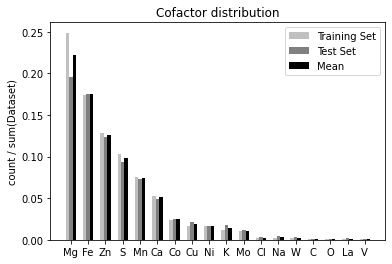

In [3]:
import numpy as np 
import matplotlib.pyplot as plt 

data = cf_new
N = 18
ind = np.arange(N)  
width = 0.2
  
xvals = data['ratio1']
bar1 = plt.bar(ind, xvals, width, color = 'silver') 
  
yvals = data['ratio2']
bar2 = plt.bar(ind+width, yvals, width, color='grey') 

zvals = data['mean']
bar3 = plt.bar(ind+width*2, zvals, width, color='black') 

plt.xticks(ind+width, data["CofactorFinal"]) 
plt.ylabel("count / sum(Dataset)") 
plt.title("Cofactor distribution") 
plt.legend((bar1, bar2, bar3), ('Training Set', 'Test Set', 'Mean'))

plt.show() 

## Solar abundances

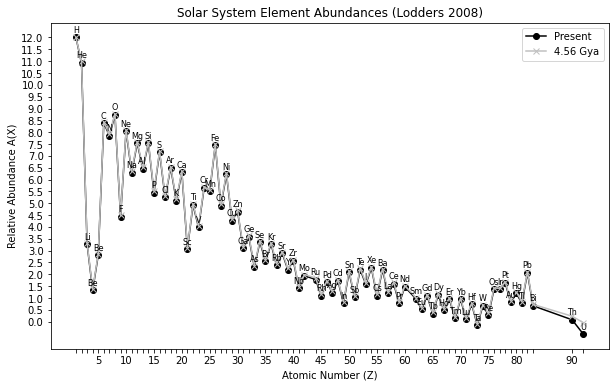

In [4]:
df = pd.read_csv("~/Desktop/data/space_odyssey/lodders2008.csv") # TODO: update file path

plt.figure(figsize=(10, 6))

plt.plot(df['Z'], df['present'], label='Present', marker='o', color='black')
plt.plot(df['Z'], df['gya4.56'], label='4.56 Gya', marker='x', color='silver')

# Adding element 'name' labels
for i, row in df.iterrows():
    plt.annotate(row['name'], (row['Z'], row['present']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=8)

# Grid / ticks (hide for figures)
plt.xticks(ticks=df['Z'], labels=[str(int(z)) if z % 5 == 0 else '' for z in df['Z']])
plt.yticks(ticks=np.arange(0, df['present'].max() + 0.5, 0.5))

plt.xlabel('Atomic Number (Z)')
plt.ylabel('Relative Abundance A(X)')
plt.title('Solar System Element Abundances (Lodders 2008)')

plt.legend()
plt.grid(False)
plt.show()


Now to focus on metals and their types:

In [5]:
cf_mean = cf_new[["CofactorFinal", "ratio1", "ratio2", "mean"]]
cf_mean = cf_mean.rename(columns={"CofactorFinal": "name"})
merged = pd.merge(left=df, right=cf_mean, on="name", how="left")
merged.head()

,Z,name,present,gya4.56,ratio1,ratio2,mean
0,1,H,12.000,12.000,NaN,NaN,NaN
1,2,He,10.925,10.986,NaN,NaN,NaN
2,3,Li,3.280,3.330,NaN,NaN,NaN
3,4,Be,1.320,1.370,NaN,NaN,NaN
4,5,Be,2.810,2.860,NaN,NaN,NaN


In [6]:
# Only with overlapping elements (solar-cofactors)

overlap = merged.copy()
overlap["mean"] = overlap["mean"].astype(str)
nan = overlap["mean"].str.contains("nan")
overlap = overlap[~nan]
overlap = overlap.reset_index().drop("index", axis=1)
overlap["mean"] = overlap["mean"].astype("f8")

overlap.head()

,Z,name,present,gya4.56,ratio1,ratio2,mean
0,6,C,8.39,8.44,0.000816,0.000582,0.000699
1,8,O,8.73,8.78,0.000816,0.000873,0.000844
2,11,Na,6.29,6.35,0.001631,0.004655,0.003143
3,12,Mg,7.54,7.60,0.248777,0.195228,0.222002
4,16,S,7.16,7.21,0.103589,0.093686,0.098638


In [7]:
metal_types = {
    'Alkali':  ["H","Li","Na","K","Rb","Cs","Fr"],
    'Alkaline': ["Be","Mg","Ca","Sr","Ba","Ra"],
    'Transition': ["Sc","Ti","V","Cr","Mn","Fe","Co","Ni","Cu","Zn","Y","Zr","Nb","Mo""Tc","Ru","Rh","Pd","Ag","Cd","Hf","Ta","W","Re","Os","Ir","Pt","Au","Hg","Mo"],
    'Post-transition': ["Al","Ga","In","Sn","Pb","Tl","Bi","Po","Fl"] ,
    'Lanthanoid': ["La","Ce","Pr","Nd","Pm","Sm","Eu","Gd","Tb","Dy","Ho","Er","Tm","Yb","Lu"],
    'Actinoid': ["Ac","Th","Pa","U","Np","Pu","Am","Cm","Bk","Cf","Es","Fm","Md","No","Lr","Rf"]
}
    #'reactive_non-metal': ["C","N","O","F","P","S","Cl","Se","Br","I"]

# Create a mapping to label elements
element_to_type = {elem: metal_type for metal_type, elems in metal_types.items() for elem in elems}
overlap['metal_type'] = overlap['name'].map(element_to_type)

# Take only metals
overlap = overlap.dropna()

# Element list
element_list = overlap["name"].to_list()
print(element_list)

overlap.head()

['Na', 'Mg', 'K', 'Ca', 'V', 'Mn', 'Fe', 'Co', 'Ni', 'Cu', 'Zn', 'Mo', 'La', 'W']


,Z,name,present,gya4.56,ratio1,ratio2,mean,metal_type
2,11,Na,6.29,6.35,0.001631,0.004655,0.003143,Alkali
3,12,Mg,7.54,7.60,0.248777,0.195228,0.222002,Alkaline
6,19,K,5.11,5.16,0.011419,0.017457,0.014438,Alkali
7,20,Ca,6.31,6.37,0.052202,0.049462,0.050832,Alkaline
8,23,V,3.99,4.04,0.000816,0.001455,0.001135,Transition


## Terrestrial abundances

In [8]:
master = pd.read_csv("~/Desktop/data/space_odyssey/solar_object_comparison.csv")

# Crust and ocean
master["log_crust"] = np.log10(master["crust_kgkg"])
master["log_sea"] = np.log10(master["seawater_kgL"])
# Note: log10(0) = -inf, will not be graphed resulting in breaks seen. Dropping values leads to graph disconnect.

# Solar and chondrite abundances both relative to Si, but on different scales (Solar 1 million x greater)
master["chondrite_Si-1"] = master["chondrite_Si-10_6"].div(10e6)
master["log_solar"] = np.log10(master["solar_Si-1"])
master["log_chondrite"] = np.log10(master["chondrite_Si-1"])

master.head()

c:\Users\jakel\anaconda3\envs\media\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\jakel\anaconda3\envs\media\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\jakel\anaconda3\envs\media\Lib\site-packages\pandas\core\arraylike.py:399: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


,element,Z,name,crust_kgkg,seawater_kgL,solar_Si-1,chondrite_Si-10_6,log_crust,log_sea,chondrite_Si-1,log_solar,log_chondrite
0,01 H hydrogen,1,H,1.400000e-03,1.080000e-01,2.800000e+04,5130000.000,-2.853872,-0.966576,5.130000e-01,4.447158,-0.289883
1,02 He helium,2,He,8.000000e-09,7.000000e-12,2.700000e+03,0.601,-8.096910,-11.154902,6.010000e-08,3.431364,-7.221126
2,03 Li lithium,3,Li,2.000000e-05,1.800000e-07,4.000000e-07,55.600,-4.698970,-6.744727,5.560000e-06,-6.397940,-5.254925
3,04 Be beryllium,4,Be,2.800000e-06,5.600000e-12,4.000000e-07,0.612,-5.552842,-11.251812,6.120000e-08,-6.397940,-7.213249
4,05 B boron,5,Be,1.000000e-05,4.440000e-06,1.100000e-05,18.800,-5.000000,-5.352617,1.880000e-06,-4.958607,-5.725842


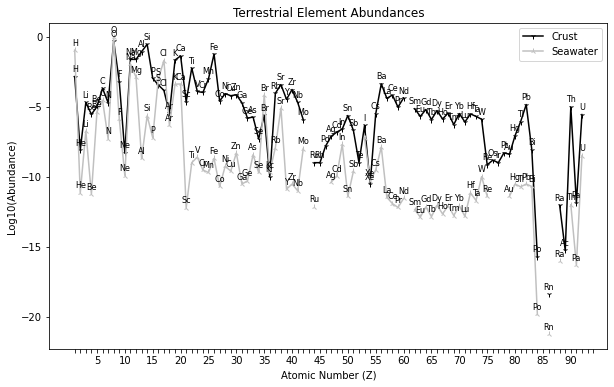

In [9]:
df = master
plt.figure(figsize=(10, 6))

plt.plot(df['Z'], df['log_crust'], label='Crust', marker='1', color='black')
plt.plot(df['Z'], df['log_sea'], label='Seawater', marker='2', color='silver')

# Adding element 'name' labels
for i, row in df.iterrows():
    plt.annotate(row['name'], (row['Z'], row['log_sea']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=8)
    plt.annotate(row['name'], (row['Z'], row['log_crust']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=8)
    
plt.xticks(ticks=df['Z'], labels=[str(int(z)) if z % 5 == 0 else '' for z in df['Z']])

plt.xlabel('Atomic Number (Z)')
plt.ylabel('Log10(Abundance)')
plt.title('Terrestrial Element Abundances')

plt.legend()
plt.grid(False)
plt.show()

## Comparisons

### Solar vs CI Chondrite

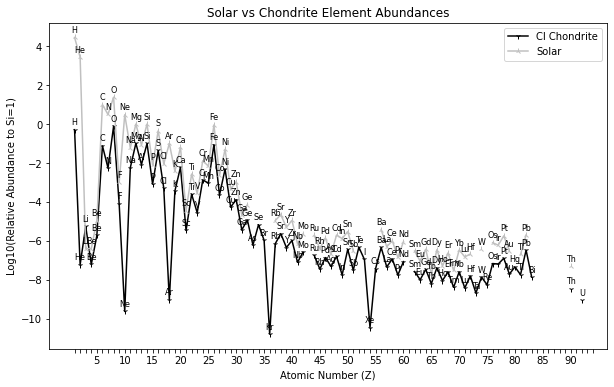

In [10]:
df = master
plt.figure(figsize=(10, 6))

plt.plot(df['Z'], df['log_chondrite'], label='CI Chondrite', marker='1', color='black')
plt.plot(df['Z'], df['log_solar'], label='Solar', marker='2', color='silver')

# Adding element 'name' labels
for i, row in df.iterrows():
    plt.annotate(row['name'], (row['Z'], row['log_solar']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=8)
    plt.annotate(row['name'], (row['Z'], row['log_chondrite']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=8)

plt.xticks(ticks=df['Z'], labels=[str(int(z)) if z % 5 == 0 else '' for z in df['Z']])

plt.xlabel('Atomic Number (Z)')
plt.ylabel('Log10(Relative Abundance to Si=1)')
plt.title('Solar vs Chondrite Element Abundances')

plt.legend()
plt.grid(False)
plt.show()

Combine with cofactors

In [11]:
# Copy cofactors dataframe from above
print(len(cf_new), "elemental cofactors")
cf_df = cf_new.copy()

# Limit master dataframe to overlap w/ elemental cofactors
maol = master.copy()
cofactors = cf_new["CofactorFinal"].to_list()
shared = maol["name"].isin(cofactors)
maol = maol[shared]

# Merge with cofactor values 
cf_df = cf_df.rename(columns={"CofactorFinal": "name"})
mame = pd.merge(left=maol, right=cf_df, on="name", how="left")

overlap = mame.copy()

# Reactive elements mapping:
metal_types = {
    'Alkali':  ["H","Li","Na","K","Rb","Cs","Fr"],
    'Alkaline': ["Be","Mg","Ca","Sr","Ba","Ra"],
    'Transition': ["Sc","Ti","V","Cr","Mn","Fe","Co","Ni","Cu","Zn","Y","Zr","Nb","Mo""Tc","Ru","Rh","Pd","Ag","Cd","Hf","Ta","W","Re","Os","Ir","Pt","Au","Hg","Mo"],
    'Post-transition': ["Al","Ga","In","Sn","Pb","Tl","Bi","Po","Fl"] ,
    'Lanthanoid': ["La","Ce","Pr","Nd","Pm","Sm","Eu","Gd","Tb","Dy","Ho","Er","Tm","Yb","Lu"],
    'Actinoid': ["Ac","Th","Pa","U","Np","Pu","Am","Cm","Bk","Cf","Es","Fm","Md","No","Lr","Rf"],
    'Reactive non-metal': ["C","N","O","F","P","S","Cl","Se","Br","I"]
}

# Color-labels for figure annotation:
metal_colors = {
    'Alkali': 'darkred',
    'Alkaline': 'darkgoldenrod',
    'Transition': 'crimson',
    'Post-transition': 'purple',
    'Lanthanoid': 'black',
    'Reactive non-metal': 'green'
}
    
# Create a mapping to label elements
element_to_type = {elem: metal_type for metal_type, elems in metal_types.items() for elem in elems}
overlap['metal_type'] = overlap['name'].map(element_to_type)

# Element list
element_list = overlap["name"].to_list()
print(element_list)

18 elemental cofactors
['C', 'O', 'Na', 'Mg', 'S', 'Cl', 'K', 'Ca', 'V', 'Mn', 'Fe', 'Co', 'Ni', 'Cu', 'Zn', 'Mo', 'La', 'W']


In [12]:
# Added as a test, since here the main y-axis is logarithmic, whereas the bar's y-axis is not
overlap["log_mean"] = np.log10(overlap["mean"])

# Mean abundance of Earth's crust/oceans
overlap["earth_mean"] = overlap[["log_crust", "log_sea"]].mean(axis=1)

# Mean abundance of sun/chondrites
overlap["system_mean"] = overlap[["log_solar", "log_chondrite"]].mean(axis=1)
overlap["et_avg"] = overlap[["earth_mean", "system_mean"]].mean(axis=1)

overlap.head()

,element,Z,name,crust_kgkg,seawater_kgL,solar_Si-1,chondrite_Si-10_6,log_crust,log_sea,chondrite_Si-1,...,count1,ratio1,count2,ratio2,mean,metal_type,log_mean,earth_mean,system_mean,et_avg
0,06 C carbon,6,C,0.00020,0.000028,10.00,760000.0,-3.698970,-4.552842,0.07600,...,1,0.000816,2,0.000582,0.000699,Reactive non-metal,-3.155658,-4.125906,-0.059593,-2.092750
1,08 O oxygen,8,O,0.46100,0.857000,24.00,7630000.0,-0.336299,-0.067019,0.76300,...,1,0.000816,3,0.000873,0.000844,Reactive non-metal,-3.073525,-0.201659,0.631368,0.214854
2,11 Na sodium,11,Na,0.02360,0.010800,0.06,57300.0,-1.627088,-1.966576,0.00573,...,2,0.001631,16,0.004655,0.003143,Alkali,-2.502618,-1.796832,-1.731847,-1.764340
3,12 Mg magnesium,12,Mg,0.02330,0.001290,1.00,1030000.0,-1.632644,-2.889410,0.10300,...,305,0.248777,671,0.195228,0.222002,Alkaline,-0.653642,-2.261027,-0.493581,-1.377304
4,16 S sulfur,16,S,0.00035,0.000905,0.45,438000.0,-3.455932,-3.043351,0.04380,...,127,0.103589,322,0.093686,0.098638,Reactive non-metal,-1.005957,-3.249642,-0.852657,-2.051149


In [13]:
c_filt = overlap["element"].str.contains("06 C")
o_filt = overlap["element"].str.contains("08 O")
overlap = overlap[~c_filt & ~o_filt]

### Cofactors - Terrestrial

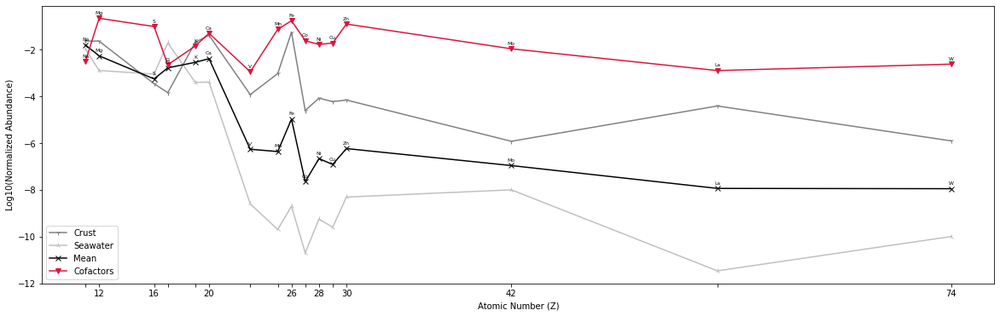

In [14]:
plt.figure(figsize=(20, 6))

plt.plot(overlap['Z'], overlap['log_crust'], label='Crust', marker='1', color='grey')
plt.plot(overlap['Z'], overlap['log_sea'], label='Seawater', marker='2', color='silver')
plt.plot(overlap['Z'], overlap['earth_mean'], label='Mean', marker='x', color='black')
plt.plot(overlap['Z'], overlap['log_mean'], label='Cofactors', marker='v', color='crimson')

# Adding element 'name' labels
for i, row in overlap.iterrows():
    plt.annotate(row['name'], (row['Z'], row['log_mean']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=6)
    plt.annotate(row['name'], (row['Z'], row['earth_mean']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=6)
    
plt.xticks(ticks=overlap['Z'], labels=[str(int(z)) if z % 2 == 0 else '' for z in overlap['Z']])

plt.xlabel('Atomic Number (Z)')
plt.ylabel('Log10(Normalized Abundance)')
#plt.title('Terrestrial Element Abundances')

plt.legend()
plt.grid(False)
plt.show()

# In theory axes should be approximately 1:1...units = kg/kg, kg/L (H2O; ~kg/kg), and normalized n/1 cofactors, all log10

### Cofactors - ET

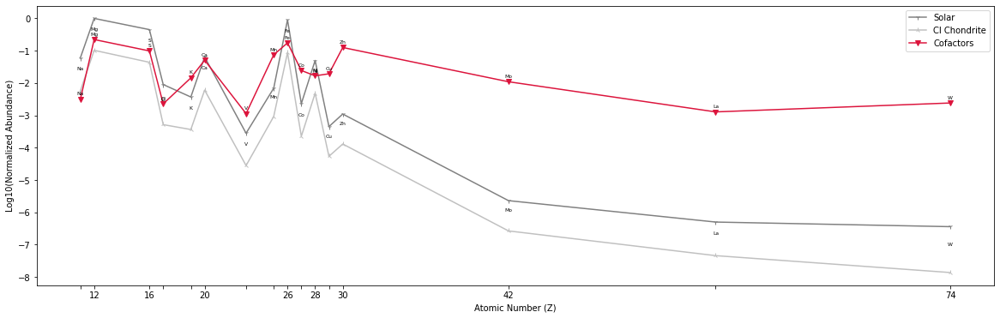

In [15]:
plt.figure(figsize=(20, 6))

plt.plot(overlap['Z'], overlap['log_solar'], label='Solar', marker='1', color='grey')
plt.plot(overlap['Z'], overlap['log_chondrite'], label='CI Chondrite', marker='2', color='silver')
#plt.plot(overlap['Z'], overlap['system_mean'], label='Mean', marker='o', color='black')
plt.plot(overlap['Z'], overlap['log_mean'], label='Cofactors', marker='v', color='crimson')

# Adding element 'name' labels
for i, row in overlap.iterrows():
    plt.annotate(row['name'], (row['Z'], row['log_mean']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=6)
    plt.annotate(row['name'], (row['Z'], row['system_mean']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=6)
    
plt.xticks(ticks=overlap['Z'], labels=[str(int(z)) if z % 2 == 0 else '' for z in overlap['Z']])

plt.xlabel('Atomic Number (Z)')
plt.ylabel('Log10(Normalized Abundance)')
#plt.title('ET Element Abundances')

plt.legend()
plt.grid(False)
plt.show()

### Cofactors - Terr + ET

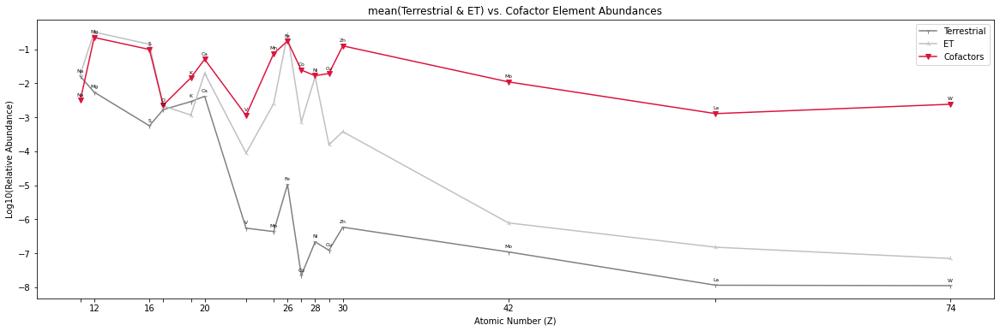

In [19]:
plt.figure(figsize=(20, 6))

plt.plot(overlap['Z'], overlap['earth_mean'], label='Terrestrial', marker='1', color='grey')
plt.plot(overlap['Z'], overlap['system_mean'], label='ET', marker='2', color='silver')
plt.plot(overlap['Z'], overlap['log_mean'], label='Cofactors', marker='v', color='crimson')

for i, row in overlap.iterrows():
    plt.annotate(row['name'], (row['Z'], row['log_mean']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=6)
    plt.annotate(row['name'], (row['Z'], row['earth_mean']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=6)
    
plt.xticks(ticks=overlap['Z'], labels=[str(int(z)) if z % 2 == 0 else '' for z in overlap['Z']])

plt.xlabel('Atomic Number (Z)')
plt.ylabel('Log10(Relative Abundance)')
plt.title('mean(Terrestrial & ET) vs. Cofactor Element Abundances')

plt.legend()
plt.grid(False)
plt.show()

### Cofactors - Mean (all)

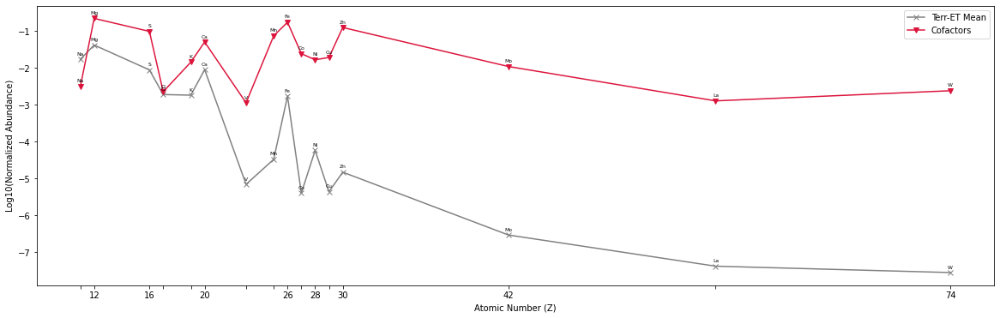

In [17]:
plt.figure(figsize=(20, 6))

plt.plot(overlap['Z'], overlap['et_avg'], label='Terr-ET Mean', marker='x', color='grey')
plt.plot(overlap['Z'], overlap['log_mean'], label='Cofactors', marker='v', color='crimson')

for i, row in overlap.iterrows():
    plt.annotate(row['name'], (row['Z'], row['log_mean']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=6)
    plt.annotate(row['name'], (row['Z'], row['et_avg']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=6)
    
plt.xticks(ticks=overlap['Z'], labels=[str(int(z)) if z % 2 == 0 else '' for z in overlap['Z']])

plt.xlabel('Atomic Number (Z)')
plt.ylabel('Log10(Normalized Abundance)')
#plt.title('mean(Terr-ET) vs. Cofactor Element Abundances')

plt.legend()
plt.grid(False)
plt.show()

Extraaaa

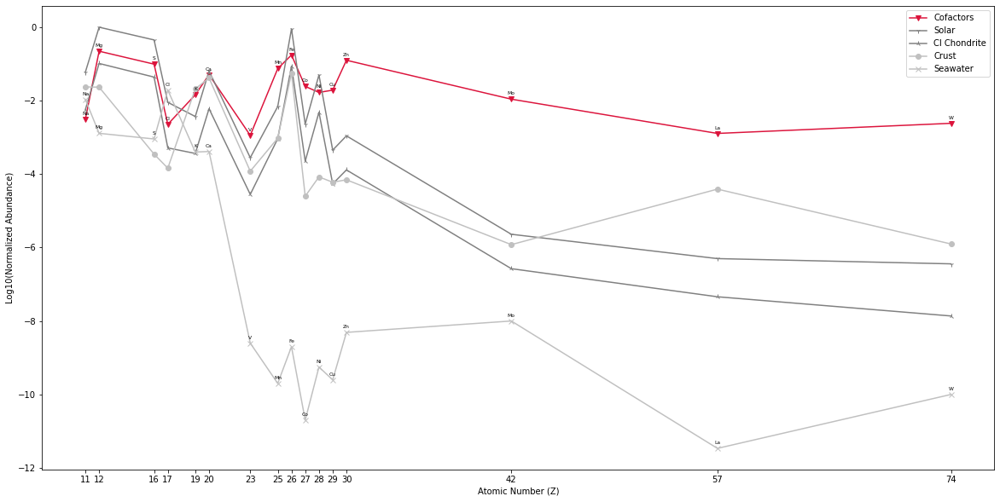

In [18]:
plt.figure(figsize=(20, 10))

# Cofactors
plt.plot(overlap['Z'], overlap['log_mean'], label='Cofactors', marker='v', color='crimson')

# Solar system
plt.plot(overlap['Z'], overlap['log_solar'], label='Solar', marker='1', color='grey')
plt.plot(overlap['Z'], overlap['log_chondrite'], label='CI Chondrite', marker='2', color='grey')

# Earth
plt.plot(overlap['Z'], overlap['log_crust'], label='Crust', marker='o', color='silver')
plt.plot(overlap['Z'], overlap['log_sea'], label='Seawater', marker='x', color='silver')

# Adding element 'name' labels
for i, row in overlap.iterrows():
    plt.annotate(row['name'], (row['Z'], row['log_mean']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=6)
    plt.annotate(row['name'], (row['Z'], row['log_sea']), 
                 textcoords="offset points", xytext=(0, 5), ha='center', fontsize=6)

#plt.xticks(ticks=overlap['Z'], labels=[str(int(z)) if z % 2 == 0 else '' for z in overlap['Z']])   
plt.xticks(ticks=overlap['Z'], labels=[str(int(z)) if z % 1 == 0 else '' for z in overlap['Z']])

plt.xlabel('Atomic Number (Z)')
plt.ylabel('Log10(Normalized Abundance)')
#plt.title('ET Element Abundances')

plt.legend()
plt.grid(False)
plt.show()